In [1]:
try:
    from pathlib import Path
    import pandas as pd
    import matplotlib.pyplot as plt
    from lib.lib_utils import Utils
    import seaborn as sns
    from lib.lib_defect_analysis import Features
    from tqdm import tqdm
    import numpy as np
    from sklearn.model_selection import train_test_split
    from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler
    import xgboost as xgb
    from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
    from tqdm import tqdm
    from matplotlib.ticker import MaxNLocator
    import cv2
    import json
    import pywt
    import xgboost as xgb
    import lightgbm as lgb
    from matplotlib.colors import LinearSegmentedColormap
    import shap
except Exception as e:
    print(f"Some module are missing: {e}\n")

/home/mario/miniconda3/envs/yolo_gdd/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
data_path = Path().resolve().joinpath("data_234_new")
yolo_model_path = Path().resolve().joinpath("models", "best_model_yolov11.pt")

xyz_files_path = data_path.joinpath("xyz_files")
images_path = data_path.joinpath("images")
crops_path = data_path.joinpath("crops")

plot_path = data_path.joinpath("plots")
pred_path = data_path.joinpath("predictions")

plot_path.mkdir(exist_ok=True, parents=True)
pred_path.mkdir(exist_ok=True, parents=True)
plt.style.use("seaborn-v0_8-paper")
colors = ["#F0741E", "#276CB3"]

custom_cmap = LinearSegmentedColormap.from_list("custom_cmap", [colors[1], colors[0]])

In [ ]:
max_dim = [39.53476932, 34.27629786]
Utils.from_xyz_to_png(xyz_files_path, images_path, max_dim=max_dim, multiplier=6)

Utils.generate_yolo_crops(
    images_path,
    crops_path,
    yolo_model_path,
    binary_mask=True,
    device="cpu",
    confidence=0.75,
)

In [4]:
def calculate_entropy(data: np.ndarray, bins: int = 256) -> float:
    data_flat = data.flatten()
    histogram, _ = np.histogram(data_flat, bins=bins, range=(0, bins), density=True)
    entropy = -np.sum(histogram * np.log2(histogram + 1e-10))
    return entropy


def clalc_shift_spect(img):
    f = np.fft.fft2(img)

    coeffs = pywt.wavedec2(img, "haar", level=2)
    return f, coeffs


def extract_frequency_features(
    image: Path | np.ndarray, wavelet: str = "db4", bins: int = 256
) -> dict:
    image = image.resolve()
    if isinstance(image, Path):
        img = cv2.imread(str(image), cv2.IMREAD_GRAYSCALE)
    else:
        img = image.copy()
        if len(img.shape) == 3:
            img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # f = np.fft.fft2(img)
    f, coeffs = clalc_shift_spect(img)
    fshift = np.fft.fftshift(f)
    magnitude_spectrum = 20 * np.log(np.abs(fshift) + 1e-10)

    mean_freq = np.mean(magnitude_spectrum)
    std_freq = np.std(magnitude_spectrum)
    max_freq = np.max(magnitude_spectrum)
    min_freq = np.min(magnitude_spectrum)
    median_freq = np.median(magnitude_spectrum)
    energy = np.sum(np.abs(fshift) ** 2)

    rows, cols = magnitude_spectrum.shape
    crow, ccol = rows // 2, cols // 2

    histogram, _ = np.histogram(
        magnitude_spectrum, bins=bins, range=(0, bins), density=True
    )
    entropy = -np.sum(histogram * np.log2(histogram + 1e-10))

    low_freq_energy = np.sum(magnitude_spectrum[:crow, :ccol])
    high_freq_energy = np.sum(magnitude_spectrum[crow:, ccol:])
    frequency_contrast = high_freq_energy - low_freq_energy

    # coeffs = pywt.wavedec2(img, wavelet, level=2)
    cA2, (cH2, cV2, cD2), (cH1, cV1, cD1) = coeffs

    wavelet_features = {
        "wavelet_energy_A2": np.sum(np.square(cA2)),
        "wavelet_energy_H2": np.sum(np.square(cH2)),
        "wavelet_energy_V2": np.sum(np.square(cV2)),
        "wavelet_energy_D2": np.sum(np.square(cD2)),
        "wavelet_std_A2": np.std(cA2),
        "wavelet_std_H2": np.std(cH2),
        "wavelet_std_V2": np.std(cV2),
        "wavelet_std_D2": np.std(cD2),
        "wavelet_energy_H1": np.sum(np.square(cH1)),
        "wavelet_energy_V1": np.sum(np.square(cV1)),
        "wavelet_energy_D1": np.sum(np.square(cD1)),
        "wavelet_std_H1": np.std(cH1),
        "wavelet_std_V1": np.std(cV1),
        "wavelet_std_D1": np.std(cD1),
        "wavelet_entropy_A2": calculate_entropy(cA2, bins),
        "wavelet_entropy_H2": calculate_entropy(cH2, bins),
        "wavelet_entropy_V2": calculate_entropy(cV2, bins),
        "wavelet_entropy_D2": calculate_entropy(cD2, bins),
        "wavelet_entropy_H1": calculate_entropy(cH1, bins),
        "wavelet_entropy_V1": calculate_entropy(cV1, bins),
        "wavelet_entropy_D1": calculate_entropy(cD1, bins),
    }

    frequency_features = {
        "mean_frequency": mean_freq,
        "std_frequency": std_freq,
        "max_frequency": max_freq,
        "min_frequency": min_freq,
        "median_frequency": median_freq,
        "energy": energy,
        "entropy": entropy,
        "low_frequency_energy": low_freq_energy,
        "high_frequency_energy": high_freq_energy,
        "frequency_contrast": frequency_contrast,
    }

    frequency_features.update(wavelet_features)

    return frequency_features

In [5]:
features_list = [
    "area",
    "perimeter",
    "circularity",
    "solidity",
    "compactness",
    "feret_diameter",
    "edge_density",
    "eccentricity",
    "number_of_edges",
    "GLCM_energy",
    "GLCM_correlation",
    "GLCM_homogeneity",
    "GLCM_energy",
    "GLCM_contrast",
    "max_frequency",
    "energy",
    "entropy",
    "std_frequency",
    "min_frequency",
    "mean_frequency",
    "median_frequency",
    "low_frequency_energy",
    "high_frequency_energy",
    "frequency_contrast",
    "wavelet_energy_A2",
    "wavelet_energy_H2",
    "wavelet_energy_V2",
    "wavelet_energy_D2",
    "wavelet_std_A2",
    "wavelet_std_H2",
    "wavelet_std_V2",
    "wavelet_std_D2",
    "wavelet_energy_H1",
    "wavelet_energy_V1",
    "wavelet_energy_D1",
    "wavelet_std_H1",
    "wavelet_std_V1",
    "wavelet_std_D1",
    "wavelet_entropy_A2",
    "wavelet_entropy_H2",
    "wavelet_entropy_V2",
    "wavelet_entropy_D2",
    "wavelet_entropy_H1",
    "wavelet_entropy_V1",
    "wavelet_entropy_D1",
]


target_list = [
    "fermi_level_ev",
    "IP_ev",
    "EA_ev",
    "band_gap_ev",
    "energy_per_atom",
    "current",
]

target_labels = {
    "fermi_level_ev": ("Fermi Level [eV] - predicted", "Fermi Level[eV] - true"),
    "EA_ev": (
        "Ionization Potential [eV] - predicted",
        "Ionization Potential [eV] - true",
    ),
    "IP_ev": ("Electron Affinity [eV] - predicted", "Electron Affinity [eV] - true"),
    "band_gap_ev": ("Band Gap [eV] - predicted", "Band Gap [eV] - true"),
    "energy_per_atom": (
        "Energy Per Atom [eV] - predicted",
        "Energy Per Atom [eV] - true",
    ),
    "current": (
        "Current [μA] - predicted",
        "Current [μA] - true",
    ),
}

In [6]:
filepath = data_path.joinpath("features.csv").exists()

In [7]:
if not filepath:
    images = [
        f for f in crops_path.iterdir() if f.suffix.lower() in Features.IMAGE_EXTENSIONS
    ]

    features = {}

    for image in tqdm(images):
        if len(features) == 0:
            keys_list = list(features.keys())
            df = pd.DataFrame(columns=keys_list)
        else:
            features.clear()

        name = image.stem.split("_crop")[0]

        with open(str(xyz_files_path.joinpath(f"{name}.xyz")), "r") as file:
            first_line = file.readline()
        n_atoms = int(first_line.strip())

        features.update({"file_name": name})
        features.update({"n_atoms": n_atoms})

        shape_features = Features.extract_shape_features(image, grayscale=True)
        if shape_features is not None:
            features.update(shape_features)

        edge_features = Features.extract_edge_features(image, grayscale=True)
        if edge_features is not None:
            features.update(edge_features)

        texture_features = Features.extract_texture_features(image)
        if texture_features is not None:
            features.update(texture_features)

        # frequency_features = Features.extract_frequency_features(image)
        # if frequency_features is not None:
        #     features.update(frequency_features)

        new_row = pd.Series(features)
        df = pd.concat([df, new_row.to_frame().T], ignore_index=True)
        df["file_name"] = df["file_name"].str.replace("_opt", "", regex=False)
    grouped_df = (
        df.groupby("file_name")
        .agg(
            {
                "n_atoms": "first",
                "area": "sum",
                "num_pixels": "sum",
                "perimeter": "sum",
                "circularity": lambda x: (x * df.loc[x.index, "area"]).sum()
                / df.loc[x.index, "area"].sum(),
                "solidity": lambda x: (x * df.loc[x.index, "area"]).sum()
                / df.loc[x.index, "area"].sum(),
                "compactness": lambda x: (x * df.loc[x.index, "area"]).sum()
                / df.loc[x.index, "area"].sum(),
                "feret_diameter": lambda x: (x * df.loc[x.index, "area"]).sum()
                / df.loc[x.index, "area"].sum(),
                "eccentricity": lambda x: (x * df.loc[x.index, "area"]).sum()
                / df.loc[x.index, "area"].sum(),
                "number_of_edges": lambda x: (x * df.loc[x.index, "area"]).sum()
                / df.loc[x.index, "area"].sum(),
                "edge_density": lambda x: (x * df.loc[x.index, "area"]).sum()
                / df.loc[x.index, "area"].sum(),
                "GLCM_contrast": lambda x: (x * df.loc[x.index, "area"]).sum()
                / df.loc[x.index, "area"].sum(),
                "GLCM_homogeneity": lambda x: (x * df.loc[x.index, "area"]).sum()
                / df.loc[x.index, "area"].sum(),
                "GLCM_energy": lambda x: (x * df.loc[x.index, "area"]).sum()
                / df.loc[x.index, "area"].sum(),
                "GLCM_correlation": lambda x: (x * df.loc[x.index, "area"]).sum()
                / df.loc[x.index, "area"].sum(),
            }
        )
        .reset_index()
    )

    #
    original_df = pd.read_csv(xyz_files_path.joinpath("target_graphene_dftb.csv"))

    energy_dict = original_df.set_index("file_name")["total_energy"].to_dict()
    fermi_dict = original_df.set_index("file_name")["Fermi_energy"].to_dict()
    ip_dict = original_df.set_index("file_name")["ionization_potential"].to_dict()
    ea_dict = original_df.set_index("file_name")["electron_affinity"].to_dict()
    band_gap_dict = original_df.set_index("file_name")["band_gap"].to_dict()
    current_dict = original_df.set_index("file_name")["current"].to_dict()
    # flake_total_area_dict = original_df.set_index("file_name")[
    #     "flake_total_area"
    # ].to_dict()

    # Aggiunta della colonna total_energy al primo dataframe
    grouped_df["total_energy_eV"] = grouped_df["file_name"].map(energy_dict)
    grouped_df["fermi_level_ev"] = grouped_df["file_name"].map(fermi_dict)
    grouped_df["IP_ev"] = grouped_df["file_name"].map(ip_dict)
    grouped_df["EA_ev"] = grouped_df["file_name"].map(ea_dict)
    grouped_df["band_gap_ev"] = grouped_df["file_name"].map(band_gap_dict)
    grouped_df["energy_per_atom"] = (
        grouped_df["total_energy_eV"] / grouped_df["n_atoms"]
    )
    grouped_df["current"] = grouped_df["file_name"].map(current_dict)
    #grouped_df["flake_total_area"] = grouped_df["file_name"].map(flake_total_area_dict)
    grouped_df = grouped_df.dropna()

    grouped_df.to_csv(data_path.joinpath("features.csv"), index=False)
else:
    grouped_df = pd.read_csv(data_path.joinpath("features.csv"))

In [8]:
frequency_dict = {}
for filename in tqdm(grouped_df["file_name"].to_list()):
    img = images_path.joinpath(f"{filename}_opt.png")
    dict_img = extract_frequency_features(img)
    frequency_dict[filename] = dict_img

100%|██████████| 12733/12733 [00:42<00:00, 299.87it/s]


Convert the current from Ampere of simulation to microampere


In [9]:
grouped_df["current"] = grouped_df["current"] * 1e6

In [10]:
frequency_df = pd.DataFrame.from_dict(frequency_dict, orient="index")
grouped_df = grouped_df.join(frequency_df, on="file_name")

Remove the tail of the distribution, current near to zero is synonym of bad graphene flake


In [11]:
indices_to_remove = grouped_df[
    (grouped_df["current"] >= grouped_df["current"].min())
    & (grouped_df["current"] <= 9e-02)
].index
print(indices_to_remove, len(indices_to_remove))
# Rimuovere le righe corrispondenti agli indici trovati
grouped_df = grouped_df.drop(indices_to_remove)

Index([190, 4536], dtype='int64') 2


In [12]:
if grouped_df.isna().any().any():
    print("Avviso: Il DataFrame contiene valori NaN.")
else:
    print("Il DataFrame non contiene valori NaN.")

Il DataFrame non contiene valori NaN.


In [13]:
df_filtrato = grouped_df#grouped_df[grouped_df["area"] / grouped_df["flake_total_area"] < 0.3]
# indices_to_remove = df_filtrato[
#     (df_filtrato["n_atoms"] >= 450)
#     # & (df_filtrato["dos"] <= df_filtrato.min() + 2 * 1e-07)
# ].index

# Rimuovere le righe corrispondenti agli indici trovati
# df_filtrato = df_filtrato.drop(indices_to_remove)
dist_path = plot_path.joinpath("distributions")
dist_path.mkdir(exist_ok=True, parents=True)
for feature in features_list:
    fig = plt.figure(figsize=(8, 8))
    ax = fig.add_subplot(1, 1, 1)  # Aggiungi subplot

    sns.histplot(
        x=df_filtrato[feature],
        fill=True,
        linewidth=1,
        kde=False,
        stat="density",
        color=colors[1],
        ax=ax,
        bins=int(np.sqrt(len(df_filtrato[feature]))),
    )

    sns.kdeplot(x=df_filtrato[feature], linewidth=2, color=colors[0], ax=ax)

    ax.xaxis.set_major_locator(
        MaxNLocator(nbins=3)
    )  # Imposta massimo 3 ticks sull'asse x
    ax.yaxis.set_major_locator(
        MaxNLocator(nbins=3)
    )  # Imposta massimo 3 ticks sull'asse y
    ax.set_xlabel(feature, fontsize=20)
    ax.set_ylabel(f"{feature} Density", fontsize=20)
    plt.tick_params(axis="both", which="major", labelsize=20)
    plt.tight_layout()
    plt.savefig(
        dist_path.joinpath(f"{feature}_distribution.png"), dpi=300, bbox_inches="tight"
    )
    plt.close(fig)

Plot the correlation matrix of all the features list


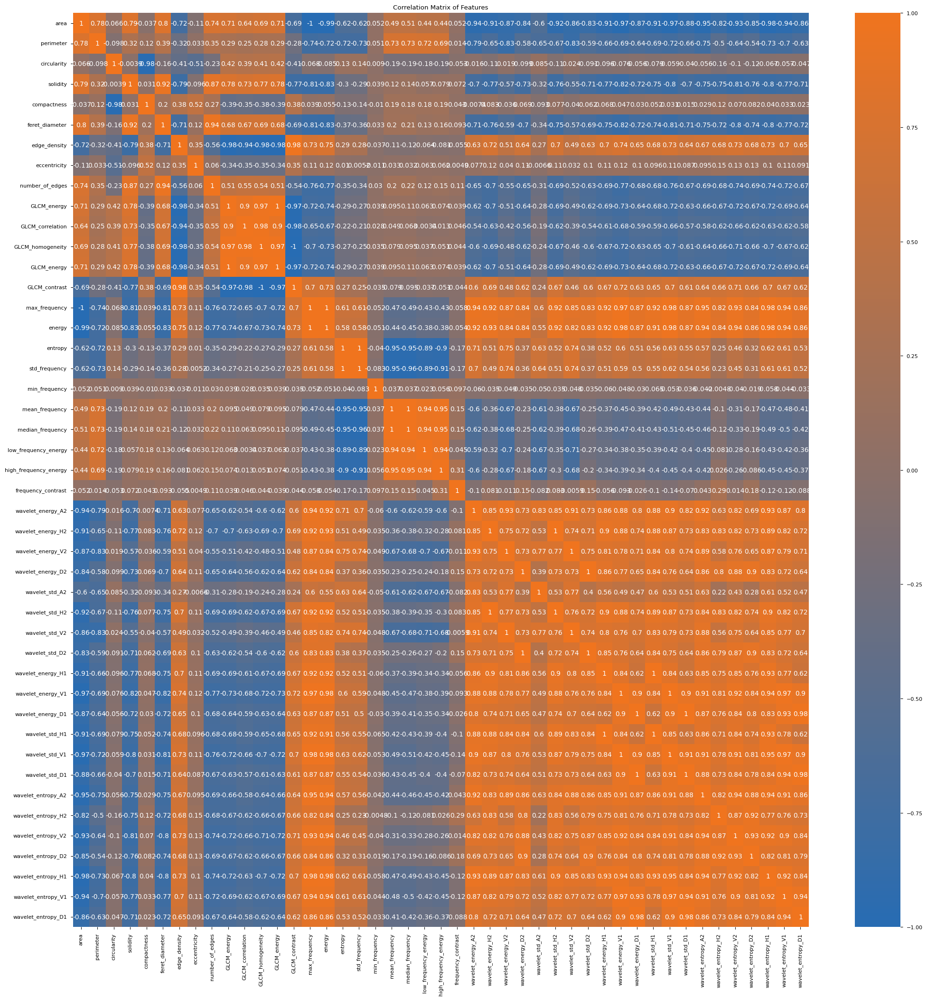

In [14]:
correlation_matrix = grouped_df[features_list].corr()
plt.figure(figsize=(25, 25))
sns.heatmap(correlation_matrix, annot=True, cmap=custom_cmap, vmin=-1, vmax=1)
plt.title("Correlation Matrix of Features")
plt.show()

XGBoost


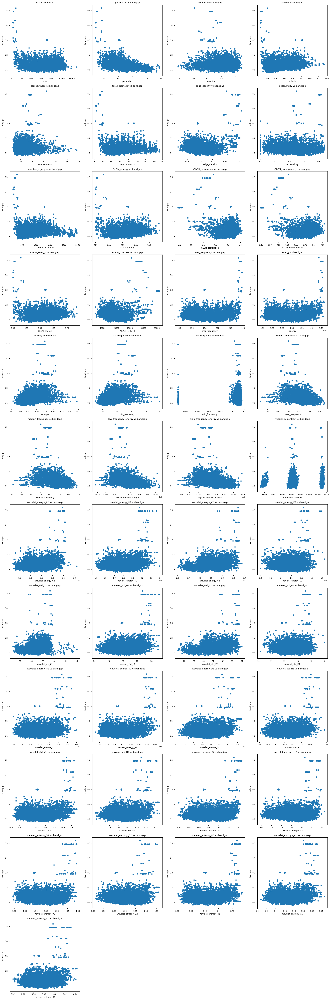

In [15]:
import pandas as pd
import matplotlib.pyplot as plt

# Lista delle feature
features_list = [
    "area", "perimeter", "circularity", "solidity", "compactness", "feret_diameter", "edge_density", "eccentricity",
    "number_of_edges", "GLCM_energy", "GLCM_correlation", "GLCM_homogeneity", "GLCM_energy", "GLCM_contrast",
    "max_frequency", "energy", "entropy", "std_frequency", "min_frequency", "mean_frequency", "median_frequency",
    "low_frequency_energy", "high_frequency_energy", "frequency_contrast", "wavelet_energy_A2", "wavelet_energy_H2",
    "wavelet_energy_V2", "wavelet_energy_D2", "wavelet_std_A2", "wavelet_std_H2", "wavelet_std_V2", "wavelet_std_D2",
    "wavelet_energy_H1", "wavelet_energy_V1", "wavelet_energy_D1", "wavelet_std_H1", "wavelet_std_V1", "wavelet_std_D1",
    "wavelet_entropy_A2", "wavelet_entropy_H2", "wavelet_entropy_V2", "wavelet_entropy_D2", "wavelet_entropy_H1",
    "wavelet_entropy_V1", "wavelet_entropy_D1"
]

# Numero di colonne per i plot
cols = 4
# Calcola il numero di righe necessarie
rows = (len(features_list) + cols - 1) // cols

plt.figure(figsize=(20, 5 * rows))

# Genera uno scatter plot per ogni feature rispetto al target
for i, feature in enumerate(features_list):
    plt.subplot(rows, cols, i + 1)
    plt.scatter(grouped_df[feature], grouped_df["band_gap_ev"])
    plt.xlabel(feature)
    plt.ylabel('bandgap')
    plt.title(f'{feature} vs bandgap')

plt.tight_layout()
plt.show()


In [ ]:
summary_path = plot_path.joinpath("shap")
summary_path.mkdir(exist_ok=True, parents=True)
params = {
    "n_estimators": 770,
    "learning_rate": 0.05121628616721255,
    "max_depth": 15,
    "gamma": 1.0412841060924395e-05,
    "min_child_weight": 6.3754851529818195,
    "colsample_bytree": 0.6501726650749249,
    "max_leaves": 148,
    "subsample": 0.913755592717715,
    "reg_alpha": 0.5268057823898837,
    "reg_lambda": 1.9309701023337404,
    "eval_metric": ["rmse", "mae"],
    # L2 regularization
}
model = xgb.XGBRegressor(**params)


# Scaled targets
scaled_targets = ["current"]

# Copy the dataframe
grouped_df = df_filtrato.copy()

# Features and normalization
X = grouped_df[features_list].values
# scaler = MinMaxScaler()
# scaler = StandardScaler()
scaler = RobustScaler()
X_norm = scaler.fit_transform(X)

# Dictionaries to store feature importance and scores
feature_importance_dict = {}
feature_importance_dict_test = {}

# Lists to store scores
scores = []
scores_train = []

# Track learning curves
learning_curves = {}

for target in tqdm(target_list):
    target_scores = []
    file_names = grouped_df["file_name"]
    y = grouped_df[target].values.flatten()
    scaler2 = RobustScaler()
    y_norm = np.squeeze(scaler2.fit_transform(y.reshape(-1, 1)))

    if target in scaled_targets:
        combined = list(zip(X_norm, y_norm, file_names))
    else:
        combined = list(zip(X_norm, y, file_names))

    train, test = train_test_split(combined, test_size=0.2, random_state=3333)

    # Separate X, y, and file_names for train and test
    X_train, y_train, file_names_train = zip(*train)
    X_test, y_test, file_names_test = zip(*test)

    # Convert to numpy arrays for use with scikit-learn
    X_train = np.array(X_train)
    X_test = np.array(X_test)
    y_train = np.round(np.array(y_train), 4)
    y_test = np.round(np.array(y_test), 4)

    # Track the learning curve
    eval_set = [(X_train, y_train), (X_test, y_test)]
    model.fit(X_train, y_train.ravel(), eval_set=eval_set, verbose=False)

    # Extract learning curve data
    eval_results = model.evals_result()
    train_rmse = np.square(eval_results["validation_0"]["rmse"])
    test_rmse = np.square(eval_results["validation_1"]["rmse"])
    train_mae = eval_results["validation_0"]["mae"]
    test_mae = eval_results["validation_1"]["mae"]
    learning_curves[target] = {
        "train_rmse": train_rmse,
        "test_rmse": test_rmse,
        "train_mae": train_mae,
        "test_mae": test_mae,
    }

    # Save learning curves to CSV
    learning_curve_df = pd.DataFrame(
        {
            "train_rmse": train_rmse,
            "test_rmse": test_rmse,
            "train_mae": train_mae,
            "test_mae": test_mae,
        }
    )
    learning_curve_df.to_csv(
        pred_path.joinpath(f"{target}_learning_curve.csv"), index=False
    )

    # Feature importance
    feature_importance = model.feature_importances_
    feature_importance_dict[f"{target}_importance"] = feature_importance

    # Predictions
    y_pred = model.predict(X_test)
    y_pred_train = model.predict(X_train)

    if target in scaled_targets:
        y_test = np.round(scaler2.inverse_transform(y_test.reshape(-1, 1)).flatten(), 4)
        y_pred = np.round(scaler2.inverse_transform(y_pred.reshape(-1, 1)).flatten(), 4)
        y_train = np.round(
            scaler2.inverse_transform(y_train.reshape(-1, 1)).flatten(), 4
        )
        y_pred_train = np.round(
            scaler2.inverse_transform(y_pred_train.reshape(-1, 1)).flatten(), 4
        )

    # Round predicted values to the fourth decimal place
    y_pred = np.round(y_pred, 4)
    y_pred_train = np.round(y_pred_train, 4)

    residual_error = y_test - y_pred
    results_df = pd.DataFrame(
        {
            f"{target}_predicted": y_pred,
            f"{target}_real": y_test,
            f"{target}_residual": residual_error,
        }
    )
    results_df_train = pd.DataFrame(
        {
            f"{target}_predicted": y_pred_train,
            f"{target}_real": y_train,
        }
    )

    # Save the DataFrame to a CSV
    results_df.to_csv(pred_path.joinpath(f"{target}_predictions.csv"), index=False)
    results_df_train.to_csv(
        pred_path.joinpath(f"{target}_predictions_train.csv"), index=False
    )

    mse = mean_squared_error(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    mse_train = mean_squared_error(y_train, y_pred_train)
    mae_train = mean_absolute_error(y_train, y_pred_train)
    r2_train = r2_score(y_train, y_pred_train)
    scores.append([mse, mae, r2])
    scores_train.append([mse_train, mae_train, r2_train])
    #SHAP explanation
    explainer = shap.Explainer(model, X_train)
    shap_values = explainer(X_test)

    # Plot SHAP summary
    shap.summary_plot(
        shap_values, X_test, feature_names=features_list, show=False, cmap=custom_cmap
    )
    plt.savefig(
        summary_path.joinpath(f"{target}_shap_summary.png"), dpi=300, bbox_inches="tight"
    )

    plt.close()

    model.save_model(data_path.joinpath(f"models/{target}_best_model_xgb.json"))
mean_scores = np.mean(scores, axis=0)
mean_scores_train = np.mean(scores_train, axis=0)

print("Mean Test Scores (MSE, MAE, R2):", mean_scores)
print("Mean Train Scores (MSE, MAE, R2):", mean_scores_train)
# Plotting the learning curves

  0%|          | 0/6 [00:00<?, ?it/s]

 67%|██████▋   | 4/6 [07:25<03:28, 104.01s/it]00]        

In [20]:
feature_importance_dict

{'fermi_level_ev_importance': array([    0.61648,    0.087341,   0.0036332,   0.0031667,   0.0022907,   0.0079129,    0.003595,   0.0031731,   0.0032646,   0.0074745,   0.0035398,   0.0023151,    0.014122,   0.0021845,    0.089382,     0.06319,   0.0015479,   0.0012207,   0.0007201,   0.0063635,   0.0038835,   0.0027154,   0.0033709,   0.0014606,
          0.0067408,   0.0017171,   0.0072914,   0.0013394,   0.0019681,    0.001926,   0.0069158,   0.0014801,   0.0017175,    0.003203,   0.0016373,   0.0017006,   0.0033513,    0.001974,   0.0015877,    0.001561,   0.0018916,   0.0016695,    0.012617,   0.0019464,   0.0014131], dtype=float32),
 'IP_ev_importance': array([    0.52978,    0.023405,   0.0058786,    0.003519,   0.0045404,   0.0073712,   0.0022951,   0.0039334,    0.005616,    0.010522,    0.006255,   0.0045441,    0.021552,    0.013569,      0.1406,    0.038736,   0.0022911,    0.002615,   0.0010461,   0.0050413,   0.0038062,   0.0037182,   0.0049305,   0.0026737,
           0.

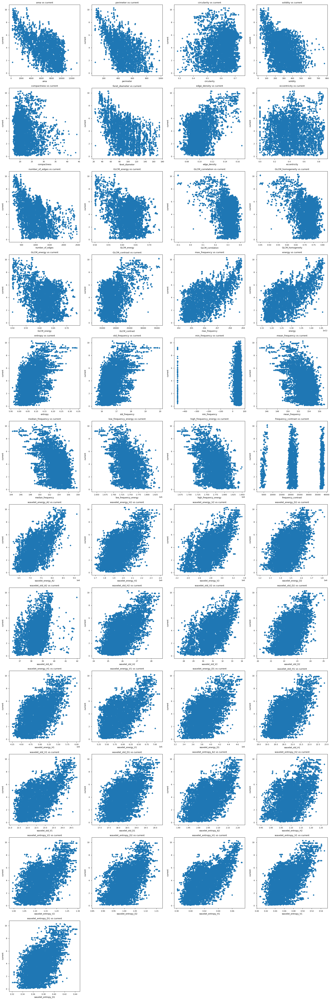

In [21]:
import pandas as pd
import matplotlib.pyplot as plt


# Numero di colonne per i plot
cols = 4
# Calcola il numero di righe necessarie
rows = (len(feature_importance_dict["current_importance"]) + cols - 1) // cols

plt.figure(figsize=(20, 5 * rows))

# Genera uno scatter plot per ogni feature rispetto al target
for i, feature in enumerate(features_list):
    plt.subplot(rows, cols, i + 1)
    plt.scatter(grouped_df[feature], grouped_df["current"])
    plt.xlabel(feature)
    plt.ylabel('current')
    plt.title(f'{feature} vs current')

plt.tight_layout()
plt.show()


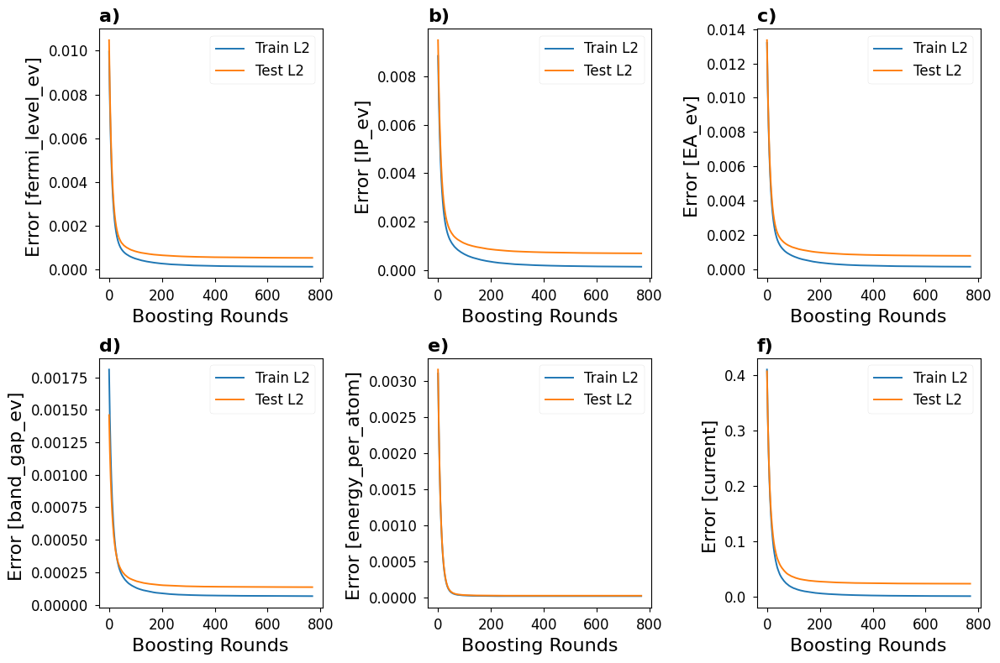

In [22]:
learn_path = plot_path.joinpath("learning_curves")
learn_path.mkdir(exist_ok=True, parents=True)

num_cols = 3
num_targets = len(target_list)
num_rows = (num_targets + num_cols - 1) // num_cols 

fig, axs = plt.subplots(num_rows, num_cols, figsize=(12, 4 * num_rows))

for idx, target in enumerate(target_list):
    learning_curve_df = pd.read_csv(pred_path.joinpath(f"{target}_learning_curve.csv"))
    row = idx // num_cols
    col = idx % num_cols

    ax = axs[row, col] if num_rows > 1 else axs[col]
    ax.plot(learning_curve_df["train_rmse"], label="Train L2")
    ax.plot(learning_curve_df["test_rmse"], label="Test L2")

    ax.set_xlabel("Boosting Rounds", fontsize=16)
    ax.set_ylabel(f"Error [{target}] ", fontsize=16)
    ax.legend(fontsize=12)
    ax.tick_params(axis='both', which='major', labelsize=12)  
    ax.tick_params(axis='both', which='minor', labelsize=10)
    letter = chr(97 + idx)  # 97 è il codice ASCII per 'a'

    ax.set_title(f"{letter})", loc='left', fontsize=16, fontweight='bold')

# Rimuovere eventuali subplot vuoti
for idx in range(num_targets, num_rows * num_cols):
    fig.delaxes(axs.flat[idx])

# Salvare la figura
plt.tight_layout()
plt.savefig(learn_path.joinpath("learning_curve_subplot_rmse.png"))
plt.show()


LightGBM


In [23]:
params = {
    "n_estimators": 770,
    "learning_rate": 0.05121628616721255,
    "max_depth": 15,
    "min_child_weight": 6.3754851529818195,
    "colsample_bytree": 0.6501726650749249,
    "num_leaves": 148,
    "subsample": 0.913755592717715,
    "reg_alpha": 0.5268057823898837,
    "reg_lambda": 1.9309701023337404,
    "objective": "regression",
}

model = lgb.LGBMRegressor(**params)

scaled_targets = ["current"]
grouped_df = df_filtrato.copy()
X = grouped_df[features_list].values
# scaler = MinMaxScaler()
scaler = RobustScaler()

X_norm = scaler.fit_transform(X)
feature_importance_dict_gbm = {}
learning_curves_gbm = {}

scores_gbm = []
scores_train_gbm = []
for target in tqdm(target_list):
    target_scores = []
    file_names = grouped_df["file_name"]
    y = grouped_df[target].values.flatten()
    

    if target in scaled_targets:
        scaler2 = RobustScaler()
        y_norm = np.squeeze(scaler2.fit_transform(y.reshape(-1, 1)))
        combined = list(zip(X_norm, y_norm, file_names))
    else:
        combined = list(zip(X_norm, y, file_names))

    train, test = train_test_split(combined, test_size=0.2, random_state=3333)

    # Separare X, y e file_names per train e test
    X_train, y_train, file_names_train = zip(*train)
    X_test, y_test, file_names_test = zip(*test)

    # Convertire in array numpy per l'utilizzo con scikit-learn
    X_train = np.array(X_train)
    X_test = np.array(X_test)
    y_train = np.array(y_train)
    y_test = np.array(y_test)

    model.fit(X_train, y_train.ravel(), eval_set=[(X_train, y_train), (X_test, y_test)])
    feature_importance = model.feature_importances_

    eval_results = model.evals_result_
    train_rmse = eval_results["valid_0"]["l2"]
    test_rmse = eval_results["valid_1"]["l2"]

    learning_curves_gbm[target] = {
        "train_rmse": train_rmse,
        "test_rmse": test_rmse,
    }

    # Save learning curves to CSV
    learning_curve_df = pd.DataFrame(
        {
            "train_rmse": train_rmse,
            "test_rmse": test_rmse,
        }
    )
    learning_curve_df.to_csv(
        pred_path.joinpath(f"gbm_{target}_learning_curve.csv"), index=False
    )

    feature_importance_dict_gbm[f"{target}_importance"] = feature_importance

    y_pred_train = model.predict(X_train)
    y_pred = model.predict(X_test)

    if target in scaled_targets:
        y_train = scaler2.inverse_transform(y_train.reshape(-1, 1)).flatten()
        y_test = scaler2.inverse_transform(y_test.reshape(-1, 1)).flatten()
        y_pred_train = scaler2.inverse_transform(y_pred_train.reshape(-1, 1)).flatten()
        y_pred = scaler2.inverse_transform(y_pred.reshape(-1, 1)).flatten()

    mse = mean_squared_error(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    mse_train = mean_squared_error(y_train, y_pred_train)
    mae_train = mean_absolute_error(y_train, y_pred_train)
    r2_train = r2_score(y_train, y_pred_train)

    explainer_gbm = shap.Explainer(model, X_train,output_names=f"{target}")
    shap_values_gbm = explainer_gbm(X_test,check_additivity=False)
    # Plot SHAP summary
    shap.summary_plot(
        shap_values_gbm, X_test, feature_names=features_list, show=False, cmap=custom_cmap, 
    )
    plt.savefig(
        summary_path.joinpath(f"gbm_{target}_shap_summary.png"),
        dpi=300,
        bbox_inches="tight",
    )
    plt.close()
    scores_gbm.append([mse, mae, r2])
    scores_train_gbm.append([mse_train, mae_train, r2_train])

    results_df = pd.DataFrame(
        {
            f"{target}_predicted": y_pred,
            f"{target}_real": y_test,
            f"{target}_residual": y_test - y_pred,
        }
    )
    results_df.to_csv(
        pred_path.joinpath(f"{target}_predictions_lightgbm.csv"), index=False
    )

    results_df_train = pd.DataFrame(
        {
            f"{target}_predicted": y_pred_train,
            f"{target}_real": y_train,
        }
    )
    results_df_train.to_csv(
        pred_path.joinpath(f"{target}_predictions_train_lightgbm.csv"), index=False
    )

# Calcolare le medie di tutte le metriche
mean_scores = np.mean(scores, axis=0)
mean_scores_train = np.mean(scores_train, axis=0)

print("Mean Test Scores (MSE, MAE, R2):", mean_scores)
print("Mean Train Scores (MSE, MAE, R2):", mean_scores_train)

  0%|          | 0/6 [00:00<?, ?it/s]

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000473 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 11475
[LightGBM] [Info] Number of data points in the train set: 10184, number of used features: 45
[LightGBM] [Info] Start training from score -4.997621
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

 17%|█▋        | 1/6 [01:20<06:42, 80.59s/it]:00]        

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000720 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 11475
[LightGBM] [Info] Number of data points in the train set: 10184, number of used features: 45
[LightGBM] [Info] Start training from score 5.086659
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

 33%|███▎      | 2/6 [02:55<05:55, 88.78s/it]:00]        

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000619 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 11475
[LightGBM] [Info] Number of data points in the train set: 10184, number of used features: 45
[LightGBM] [Info] Start training from score 4.945321
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

 50%|█████     | 3/6 [04:27<04:30, 90.31s/it]:00]        

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000403 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 11475
[LightGBM] [Info] Number of data points in the train set: 10184, number of used features: 45
[LightGBM] [Info] Start training from score 0.141338
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

 67%|██████▋   | 4/6 [05:10<02:23, 71.58s/it]:00]        

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000736 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 11475
[LightGBM] [Info] Number of data points in the train set: 10184, number of used features: 45
[LightGBM] [Info] Start training from score -47.210072
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

 83%|████████▎ | 5/6 [05:35<00:54, 54.91s/it]0:00]       

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000679 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 11475
[LightGBM] [Info] Number of data points in the train set: 10184, number of used features: 45
[LightGBM] [Info] Start training from score 0.005992
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

100%|██████████| 6/6 [08:14<00:00, 82.39s/it]:00]        

Mean Test Scores (MSE, MAE, R2): [   0.045123    0.050957     0.94787]
Mean Train Scores (MSE, MAE, R2): [  0.0020249     0.01353     0.98736]


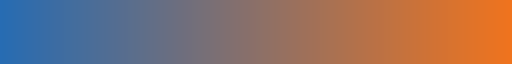

In [24]:
custom_cmap

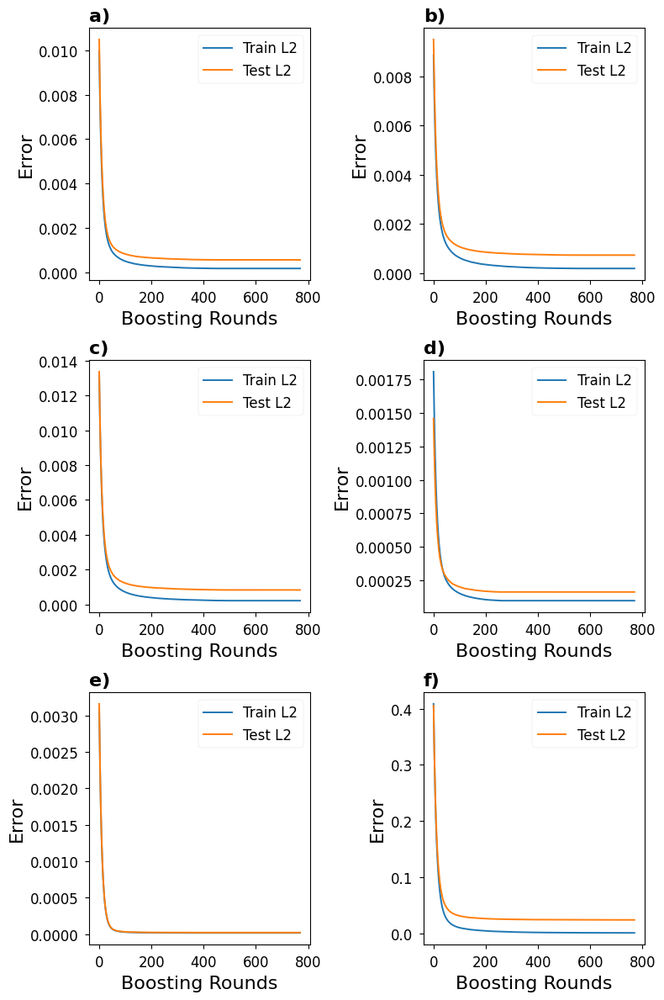

In [25]:
num_cols = 2

num_targets = len(target_list)
num_rows = (num_targets + num_cols - 1) // num_cols  # Arrotondare verso l'alto

# Creare i subplots
fig, axs = plt.subplots(num_rows, num_cols, figsize=(8, 4 * num_rows))

# Iterare sui target e sugli assi
for idx, target in enumerate(target_list):
    learning_curve_df = pd.read_csv(pred_path.joinpath(f"gbm_{target}_learning_curve.csv"))
    row = idx // num_cols
    col = idx % num_cols

    ax = axs[row, col] if num_rows > 1 else axs[col]
    ax.plot(learning_curve_df["train_rmse"], label="Train L2")
    ax.plot(learning_curve_df["test_rmse"], label="Test L2")

    ax.set_xlabel("Boosting Rounds", fontsize=16)
    ax.set_ylabel("Error", fontsize=16)
    ax.legend(fontsize=12)
    ax.tick_params(axis='both', which='major', labelsize=12)  # Ingrandisce i tick principali
    ax.tick_params(axis='both', which='minor', labelsize=10)
    letter = chr(97 + idx)  # 97 è il codice ASCII per 'a'

    ax.set_title(f"{letter})", loc='left', fontsize=16, fontweight='bold')

# Rimuovere eventuali subplot vuoti
for idx in range(num_targets, num_rows * num_cols):
    fig.delaxes(axs.flat[idx])

# Salvare la figura
plt.tight_layout()
plt.savefig(learn_path.joinpath("gbm_learning_curve_subplot_rmse.png"))
plt.show()


Text(0, 0.5, 'R2 score')

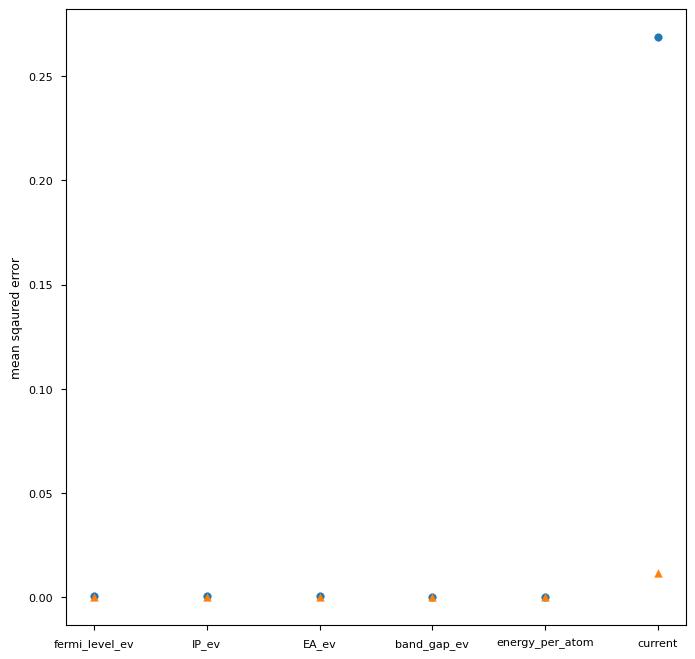

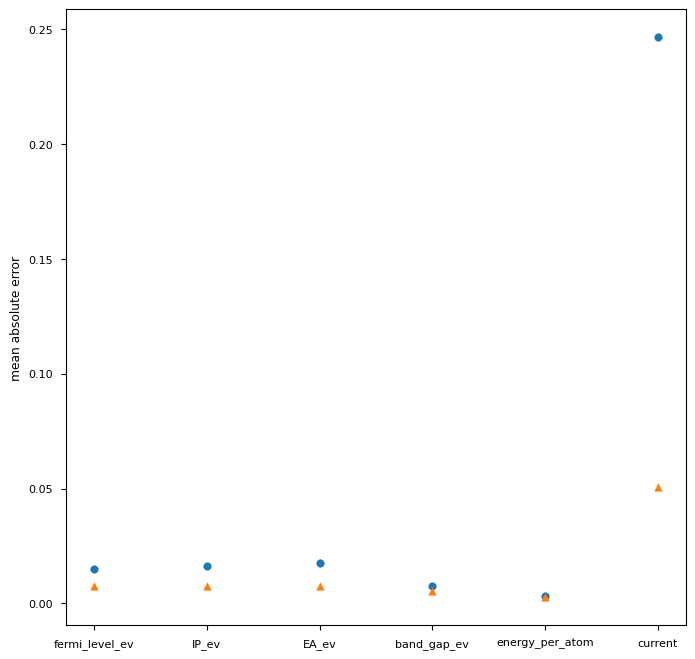

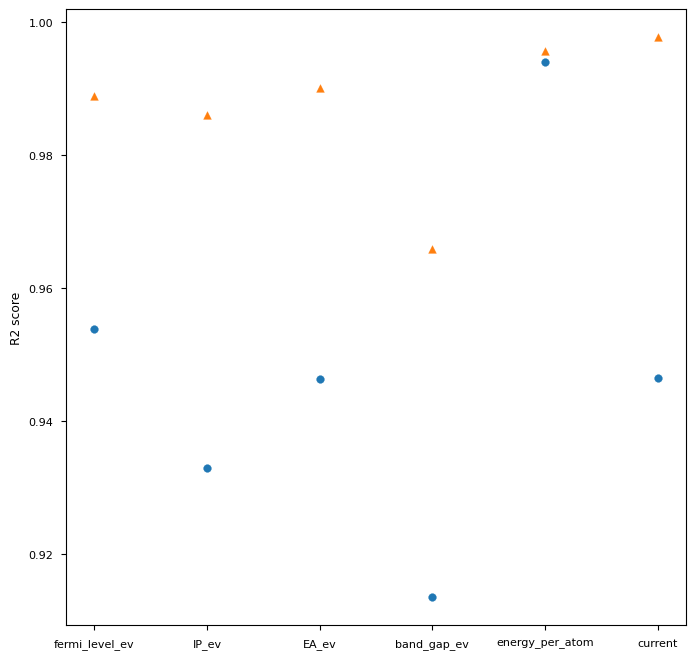

In [26]:
scores_array = np.array(scores)
scores_array_train = np.array(scores_train)

plt.figure(figsize=(8, 8))
plt.scatter(target_list, scores_array[:, 0])
plt.scatter(target_list, scores_array_train[:, 0], marker="^")
plt.ylabel("mean sqaured error")
plt.figure(figsize=(8, 8))
plt.scatter(target_list, scores_array[:, 1])
plt.scatter(target_list, scores_array_train[:, 1], marker="^")

plt.ylabel("mean absolute error")
plt.figure(figsize=(8, 8))
plt.scatter(target_list, scores_array[:, 2])
plt.scatter(target_list, scores_array_train[:, 2], marker="^")
plt.ylabel("R2 score")

In [27]:
scores_array

array([[ 0.00052599,    0.014738,     0.95389],
       [ 0.00068679,    0.016443,       0.933],
       [ 0.00077792,    0.017375,      0.9463],
       [ 0.00013577,   0.0076121,     0.91352],
       [ 2.0869e-05,   0.0030444,     0.99402],
       [    0.26859,     0.24653,      0.9465]])

Text(0, 0.5, 'R2 score')

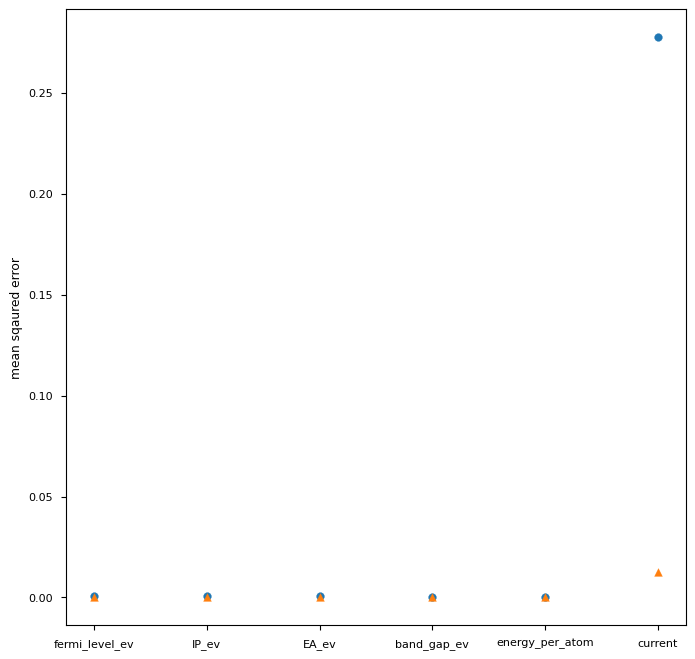

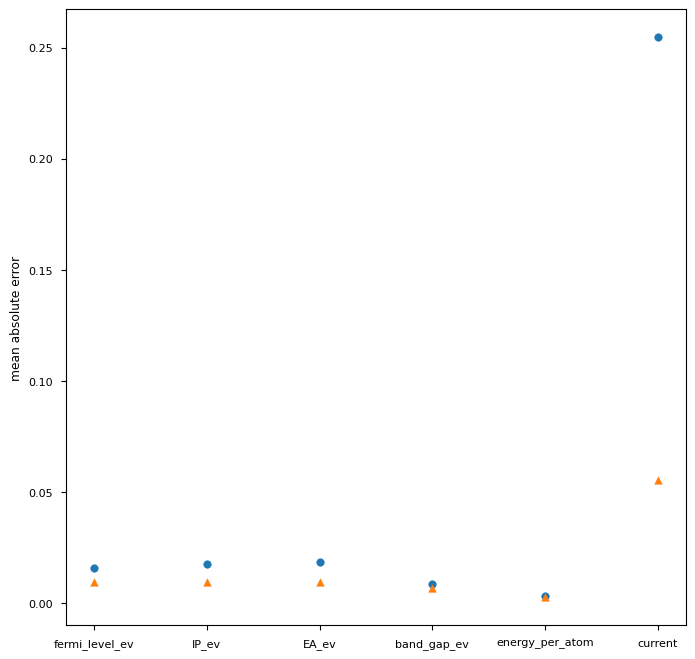

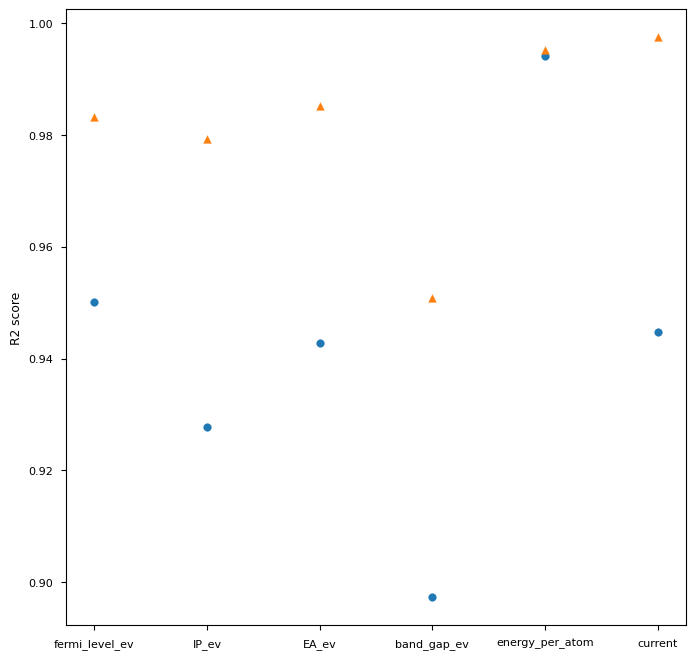

In [28]:
scores_array_gmb = np.array(scores_gbm)
scores_array_train_gbm = np.array(scores_train_gbm)

plt.figure(figsize=(8, 8))
plt.scatter(target_list, scores_array_gmb[:, 0])
plt.scatter(target_list, scores_array_train_gbm[:, 0], marker="^")
plt.ylabel("mean sqaured error")
plt.figure(figsize=(8, 8))
plt.scatter(target_list, scores_array_gmb[:, 1])
plt.scatter(target_list, scores_array_train_gbm[:, 1], marker="^")

plt.ylabel("mean absolute error")
plt.figure(figsize=(8, 8))
plt.scatter(target_list, scores_array_gmb[:, 2])
plt.scatter(target_list, scores_array_train_gbm[:, 2], marker="^")
plt.ylabel("R2 score")

Plot on the test set prediction vs real


XGBoost


<Figure size 800x800 with 0 Axes>

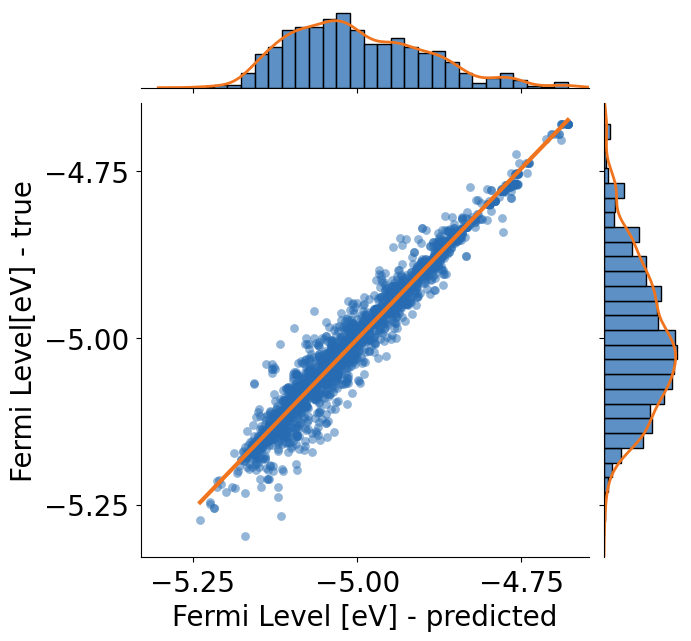

<Figure size 800x800 with 0 Axes>

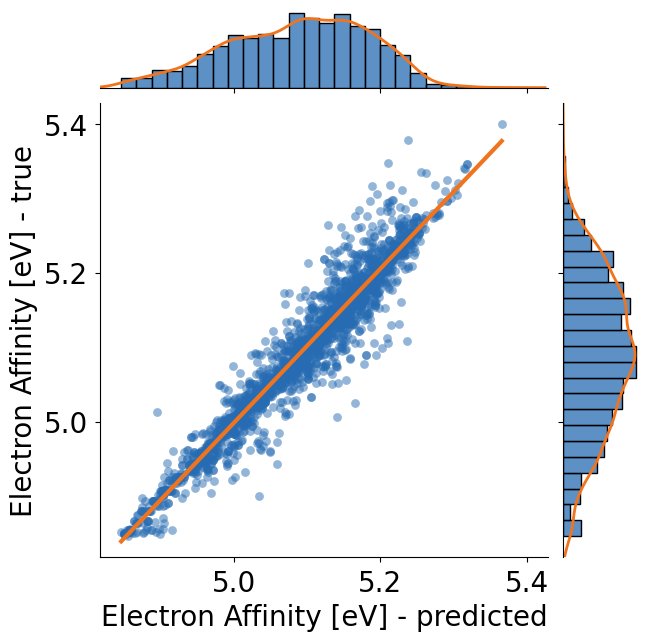

<Figure size 800x800 with 0 Axes>

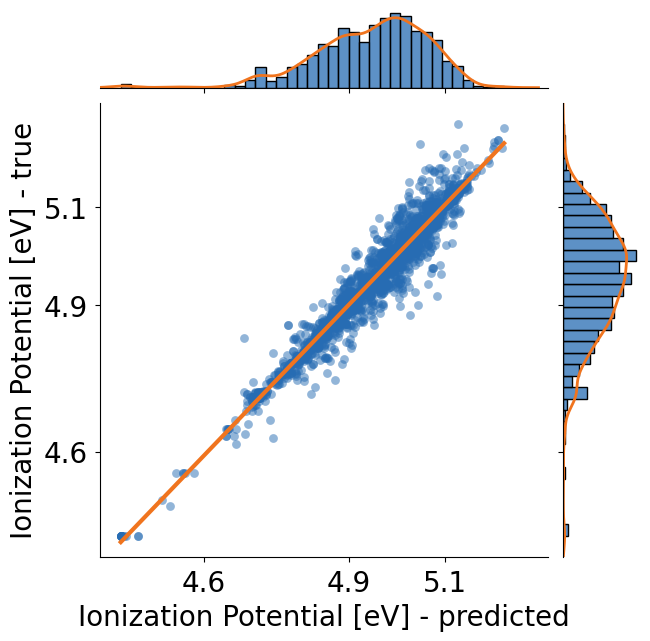

<Figure size 800x800 with 0 Axes>

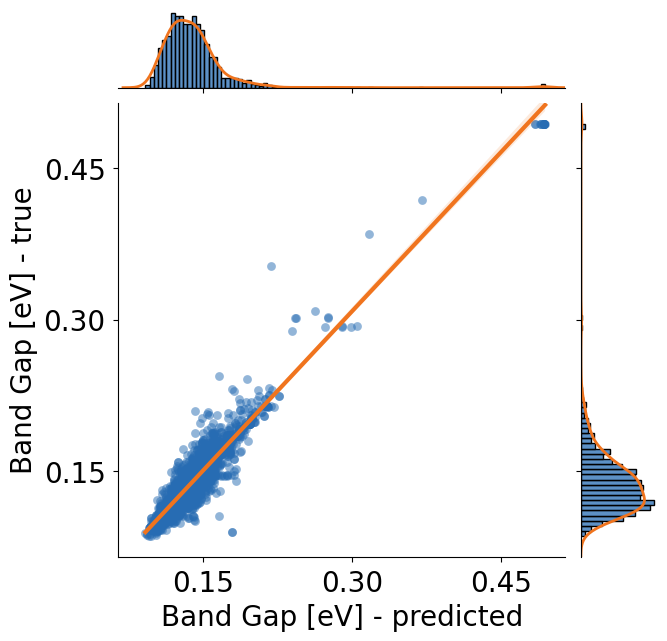

<Figure size 800x800 with 0 Axes>

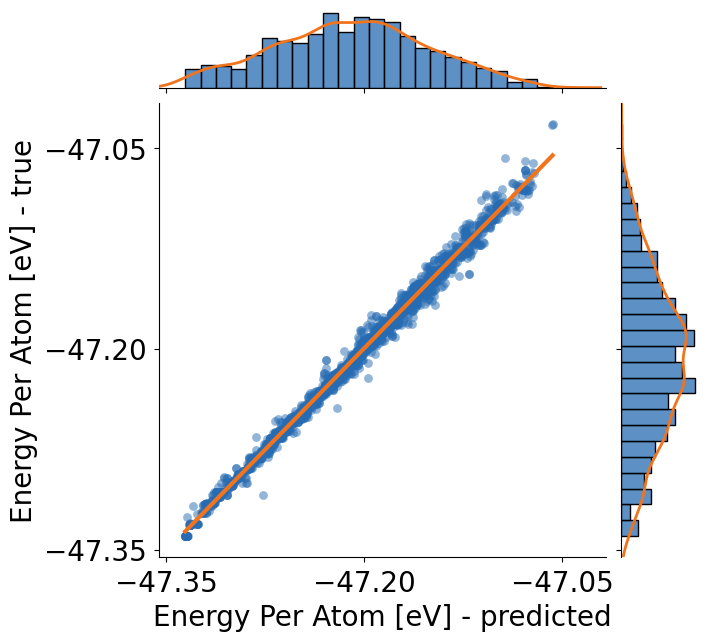

<Figure size 800x800 with 0 Axes>

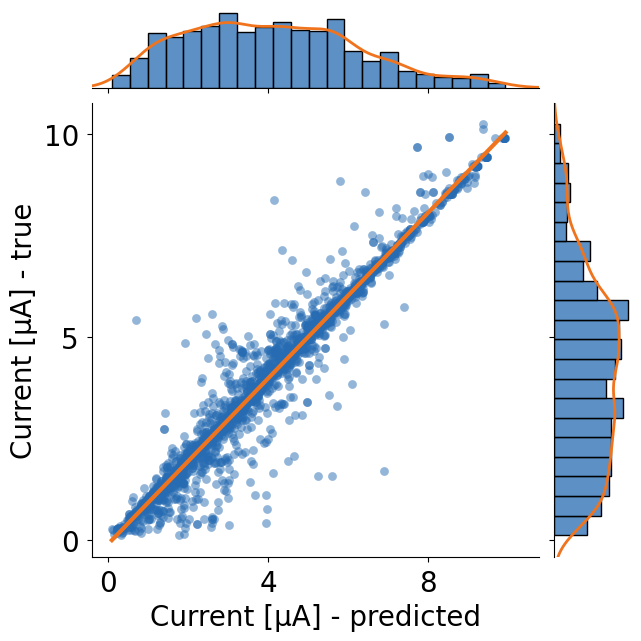

In [29]:
fit_path = plot_path.joinpath("fit")
fit_path.mkdir(exist_ok=True, parents=True)
ionisation_potential_ticks = [5.1,4.9,4.6]

for target in target_list:
    df = pd.read_csv(pred_path.joinpath(f"{target}_predictions.csv"), header=0)

    MAX = np.max(
        [df[f"{target}_predicted"].to_numpy(), df[f"{target}_real"].to_numpy()]
    )
    MIN = np.min(
        [df[f"{target}_predicted"].to_numpy(), df[f"{target}_real"].to_numpy()]
    )

    offset = 0.05 * np.abs(MAX - MIN)
    bound = [MIN - offset, MAX + offset]

    fig = plt.figure(figsize=(8, 8))

    g = sns.JointGrid()
    x, y = df[f"{target}_predicted"], df[f"{target}_real"]
    sns.regplot(
        x=f"{target}_predicted",
        y=f"{target}_real",
        data=df,
        ax=g.ax_joint,
        scatter_kws={"s": 40, "alpha": 0.5, "color": colors[1]},
        line_kws={"linewidth": 3, "alpha": 1, "color": colors[0]},
    )
    sns.histplot(
        x=x,
        fill=True,
        linewidth=1,
        kde=False,
        ax=g.ax_marg_x,
        stat="density",
        color=colors[1],
    )
    sns.kdeplot(x=x, linewidth=2, ax=g.ax_marg_x, color=colors[0])
    sns.histplot(
        y=y,
        fill=True,
        linewidth=1,
        kde=False,
        ax=g.ax_marg_y,
        stat="density",
        color=colors[1],
    )
    sns.kdeplot(y=y, linewidth=2, ax=g.ax_marg_y, color=colors[0])
    g.ax_joint.set_xlim(bound)
    g.ax_joint.set_ylim(bound)
    g.ax_joint.tick_params(axis="both", which="major", labelsize=20)
    if target=='EA_ev':
        g.ax_joint.set_xticks(ionisation_potential_ticks)
        g.ax_joint.set_yticks(ionisation_potential_ticks)
    else:
        g.ax_joint.xaxis.set_major_locator(
            MaxNLocator(nbins=3, min_n_ticks=3)
        )  # Auto tick locator
        g.ax_joint.yaxis.set_major_locator(MaxNLocator(nbins=2, min_n_ticks=3))  #  #
    g.set_axis_labels(
        target_labels[f"{target}"][0], target_labels[f"{target}"][1], fontsize=20
    )

    plt.savefig(fit_path.joinpath(f"{target}_fit.png"), dpi=300, bbox_inches="tight")

LightGBM


<Figure size 800x800 with 0 Axes>

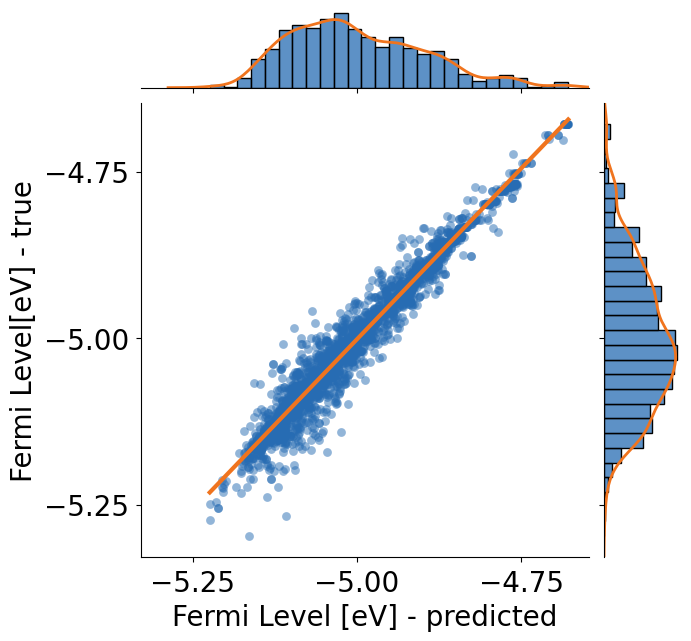

<Figure size 800x800 with 0 Axes>

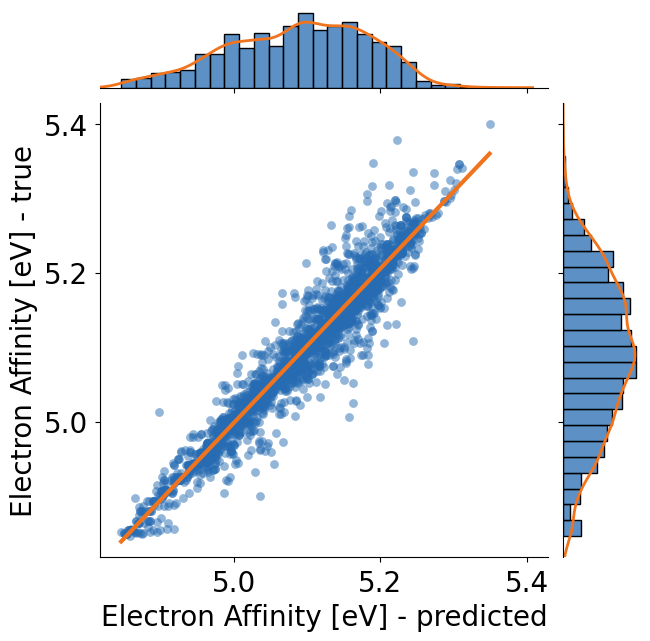

<Figure size 800x800 with 0 Axes>

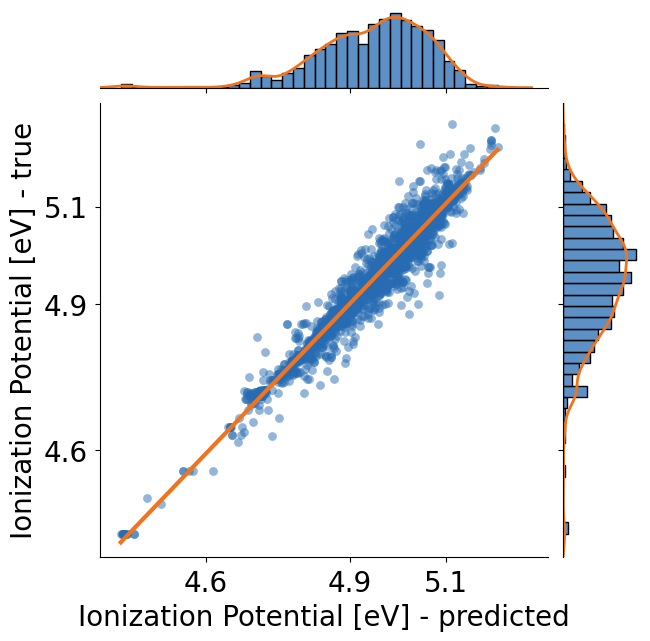

<Figure size 800x800 with 0 Axes>

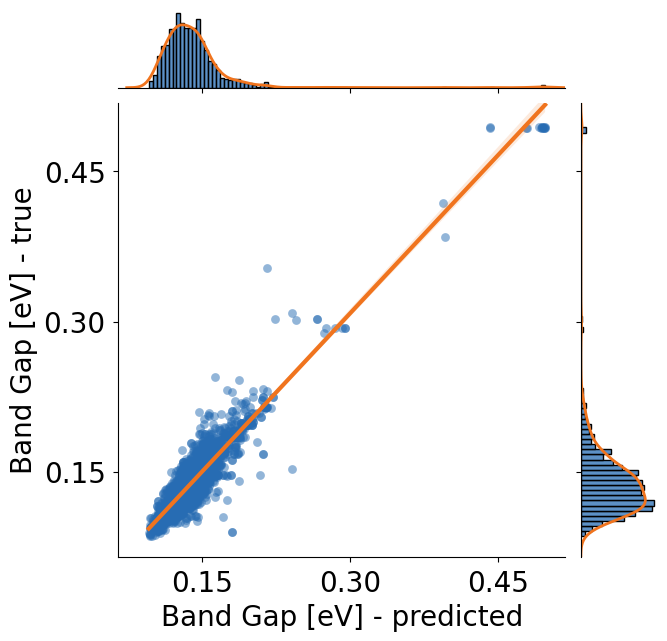

<Figure size 800x800 with 0 Axes>

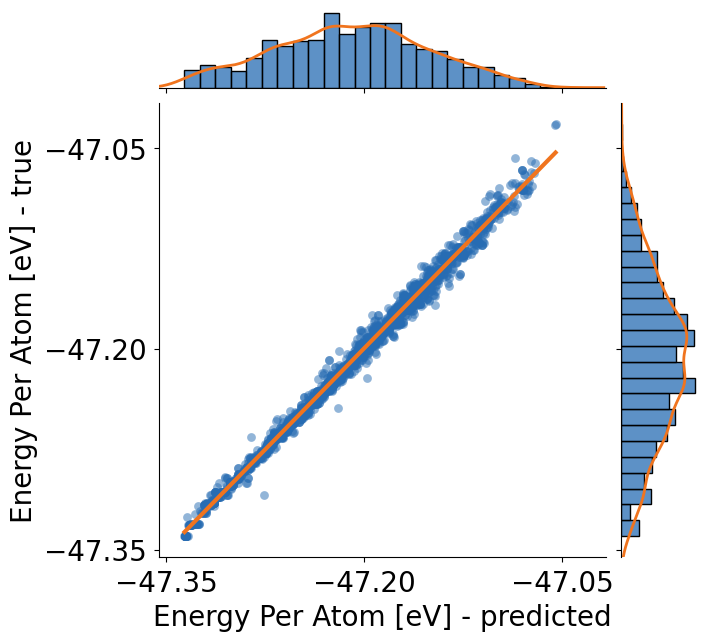

<Figure size 800x800 with 0 Axes>

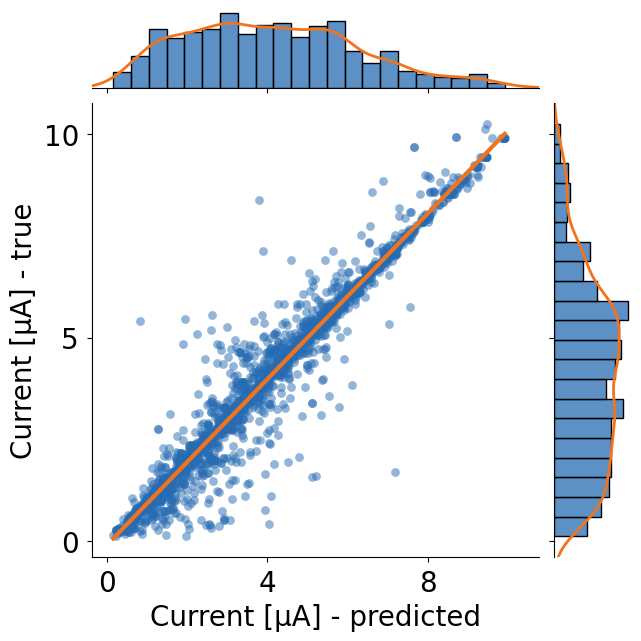

In [30]:
for target in target_list:
    df = pd.read_csv(pred_path.joinpath(f"{target}_predictions_lightgbm.csv"), header=0)

    MAX = np.max(
        [df[f"{target}_predicted"].to_numpy(), df[f"{target}_real"].to_numpy()]
    )
    MIN = np.min(
        [df[f"{target}_predicted"].to_numpy(), df[f"{target}_real"].to_numpy()]
    )

    offset = 0.05 * np.abs(MAX - MIN)
    bound = [MIN - offset, MAX + offset]

    fig = plt.figure(figsize=(8, 8))

    g = sns.JointGrid()
    x, y = df[f"{target}_predicted"], df[f"{target}_real"]
    sns.regplot(
        x=f"{target}_predicted",
        y=f"{target}_real",
        data=df,
        ax=g.ax_joint,
        scatter_kws={"s": 40, "alpha": 0.5, "color": colors[1]},
        line_kws={"linewidth": 3, "alpha": 1, "color": colors[0]},
    )
    sns.histplot(
        x=x,
        fill=True,
        linewidth=1,
        kde=False,
        ax=g.ax_marg_x,
        stat="density",
        color=colors[1],
    )
    sns.kdeplot(x=x, linewidth=2, ax=g.ax_marg_x, color=colors[0])
    sns.histplot(
        y=y,
        fill=True,
        linewidth=1,
        kde=False,
        ax=g.ax_marg_y,
        stat="density",
        color=colors[1],
    )
    sns.kdeplot(y=y, linewidth=2, ax=g.ax_marg_y, color=colors[0])
    g.ax_joint.set_xlim(bound)
    g.ax_joint.set_ylim(bound)
    g.ax_joint.tick_params(axis="both", which="major", labelsize=20)
    if target=='EA_ev':
        g.ax_joint.set_xticks(ionisation_potential_ticks)
        g.ax_joint.set_yticks(ionisation_potential_ticks)
    else:
        g.ax_joint.xaxis.set_major_locator(
            MaxNLocator(nbins=3, min_n_ticks=3)
        )  # Auto tick locator
        g.ax_joint.yaxis.set_major_locator(MaxNLocator(nbins=2, min_n_ticks=3))  #
    g.set_axis_labels(
        target_labels[f"{target}"][0], target_labels[f"{target}"][1], fontsize=20
    )

    plt.savefig(
        fit_path.joinpath(f"gbm_{target}_fit.png"), dpi=300, bbox_inches="tight"
    )

Plot on the train set prediction vs real


XGBoost


<Figure size 800x800 with 0 Axes>

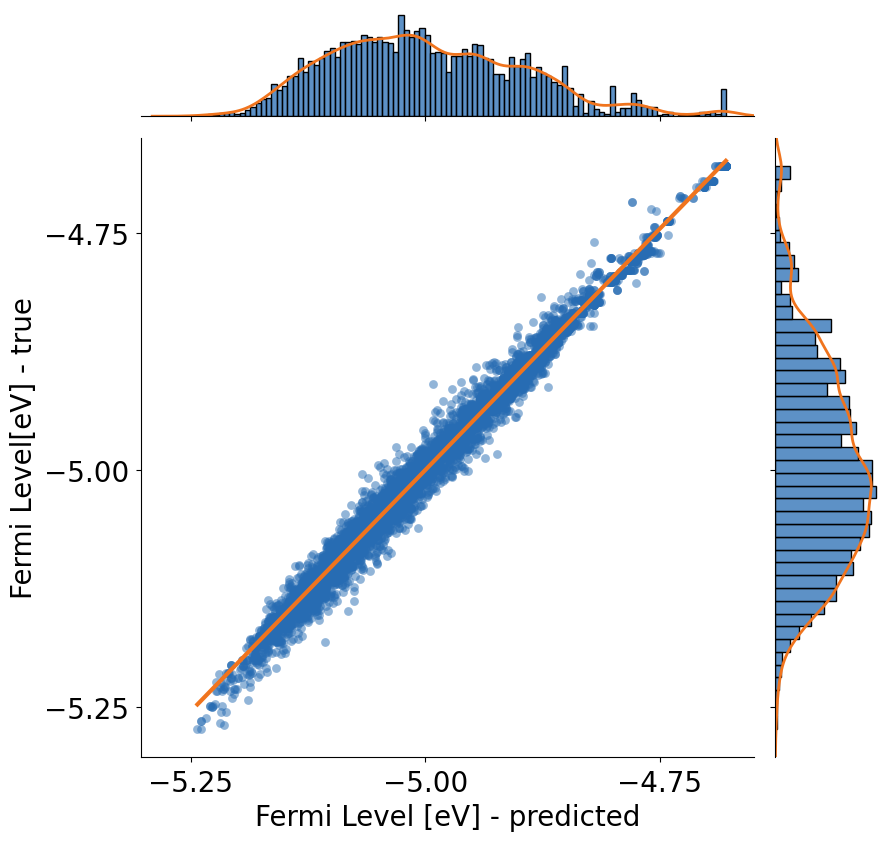

<Figure size 800x800 with 0 Axes>

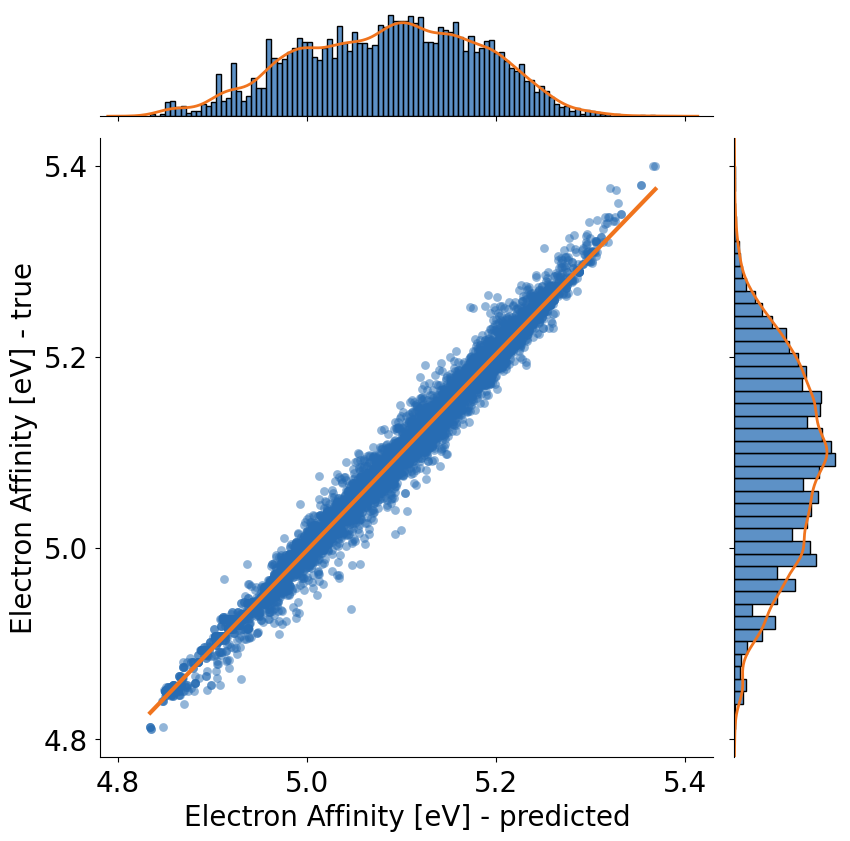

<Figure size 800x800 with 0 Axes>

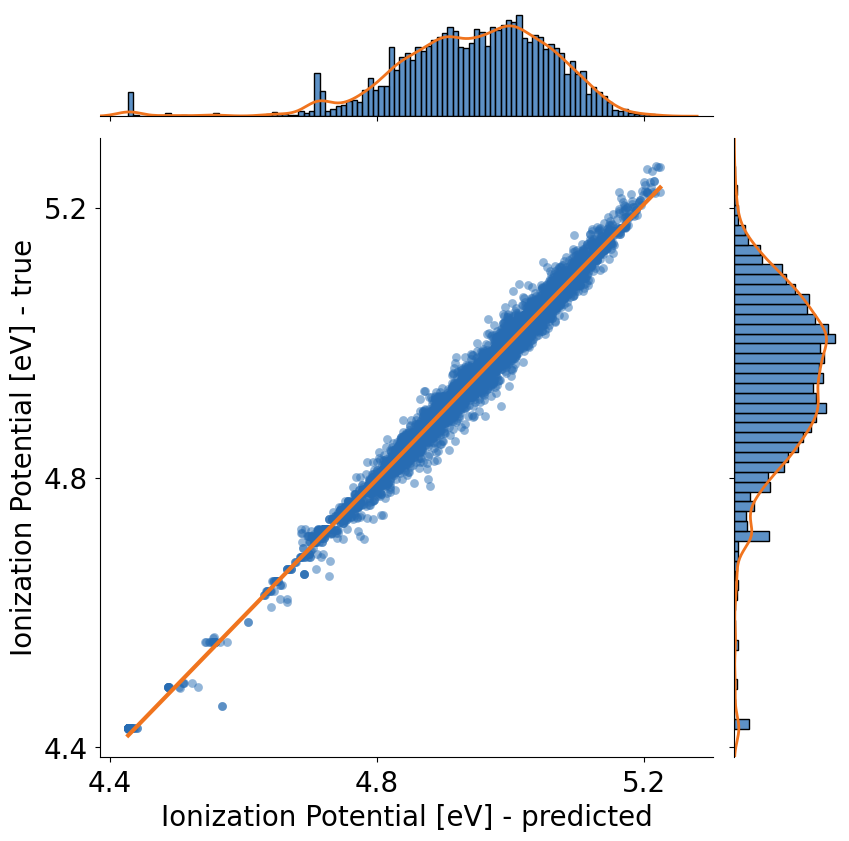

<Figure size 800x800 with 0 Axes>

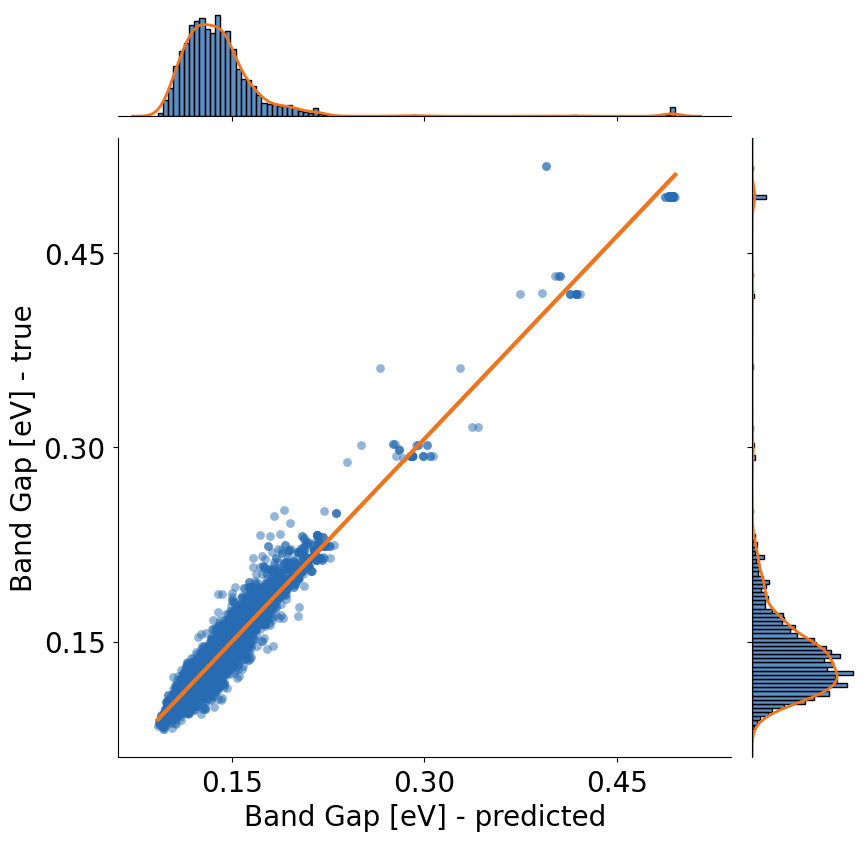

<Figure size 800x800 with 0 Axes>

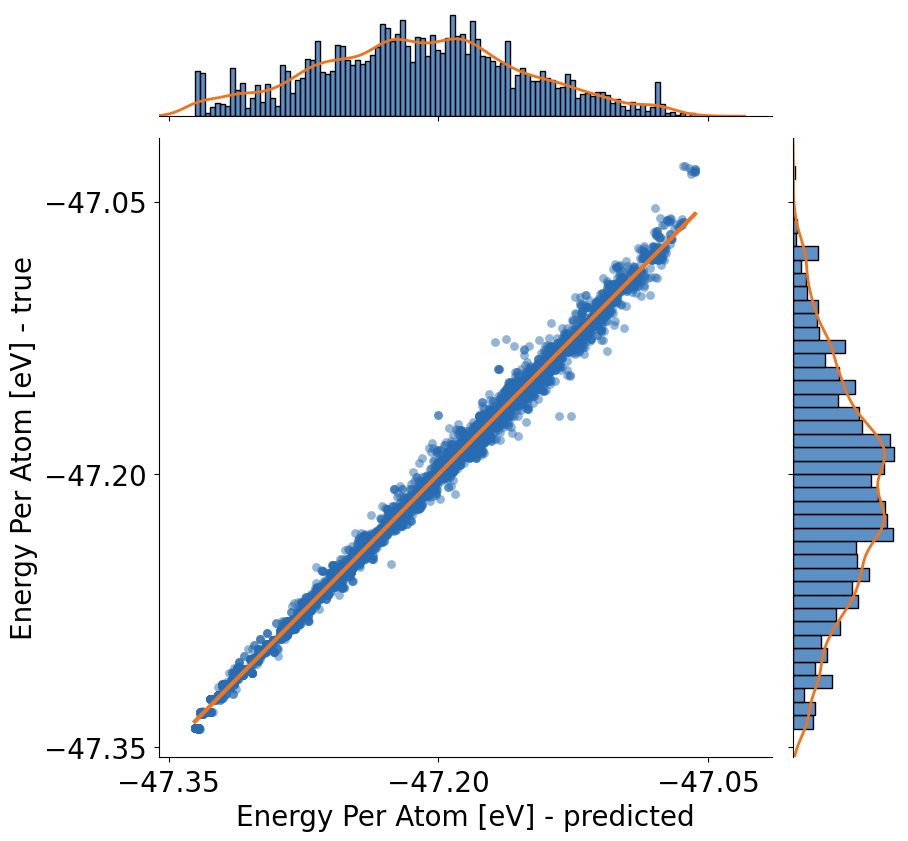

<Figure size 800x800 with 0 Axes>

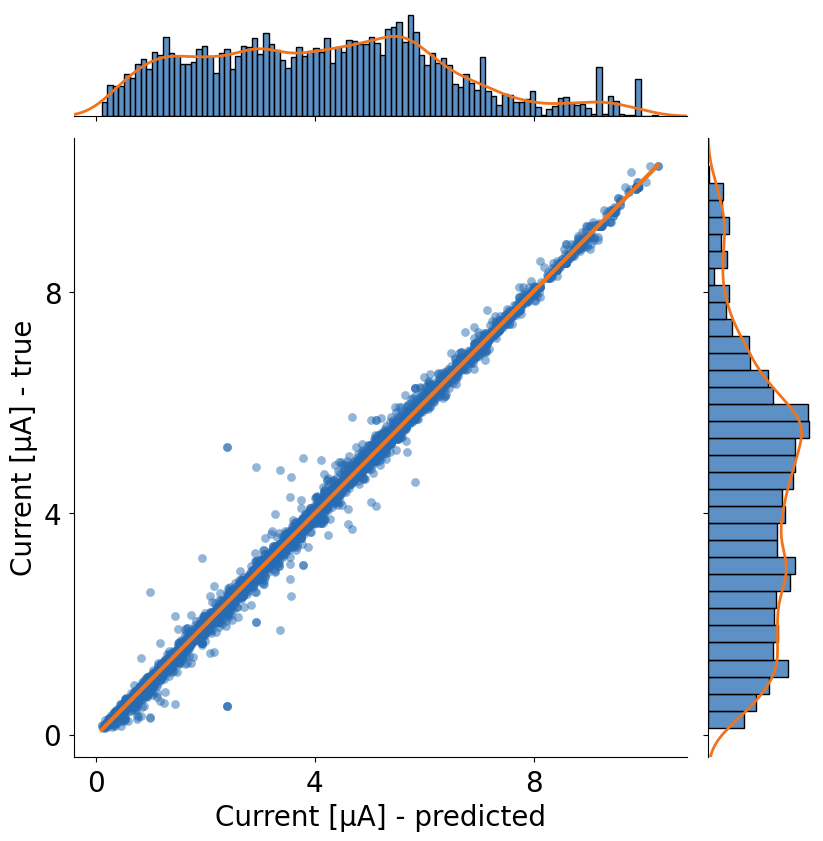

In [31]:
for target in target_list:
    df = pd.read_csv(pred_path.joinpath(f"{target}_predictions_train.csv"), header=0)

    MAX = np.max(
        [df[f"{target}_predicted"].to_numpy(), df[f"{target}_real"].to_numpy()]
    )
    MIN = np.min(
        [df[f"{target}_predicted"].to_numpy(), df[f"{target}_real"].to_numpy()]
    )

    offset = 0.05 * np.abs(MAX - MIN)
    bound = [MIN - offset, MAX + offset]

    fig = plt.figure(figsize=(8, 8))

    g = sns.JointGrid(height=8)
    x, y = df[f"{target}_predicted"], df[f"{target}_real"]
    sns.regplot(
        x=f"{target}_predicted",
        y=f"{target}_real",
        data=df,
        ax=g.ax_joint,
        scatter_kws={"s": 40, "alpha": 0.5, "color": colors[1]},
        line_kws={"linewidth": 3, "alpha": 1, "color": colors[0]},
    )
    sns.histplot(
        x=x,
        fill=True,
        linewidth=1,
        kde=False,
        ax=g.ax_marg_x,
        stat="density",
        color=colors[1],
        bins=int(np.sqrt(len(x))),
    )
    sns.kdeplot(x=x, linewidth=2, ax=g.ax_marg_x, color=colors[0])
    sns.histplot(
        y=y,
        fill=True,
        linewidth=1,
        kde=False,
        ax=g.ax_marg_y,
        stat="density",
        color=colors[1],
    )
    sns.kdeplot(y=y, linewidth=2, ax=g.ax_marg_y, color=colors[0])

    g.ax_joint.set_xlim(bound)
    g.ax_joint.set_ylim(bound)
    g.ax_joint.tick_params(axis="both", which="major", labelsize=20)
    g.ax_joint.xaxis.set_major_locator(
        MaxNLocator(nbins=3, min_n_ticks=3)
    )  # Auto tick locator
    g.ax_joint.yaxis.set_major_locator(MaxNLocator(nbins=3, min_n_ticks=3))  #
    g.set_axis_labels(
        target_labels[f"{target}"][0], target_labels[f"{target}"][1], fontsize=20
    )

    plt.savefig(
        fit_path.joinpath(f"{target}_fit_train.png"), dpi=300, bbox_inches="tight"
    )

LightGBM


<Figure size 800x800 with 0 Axes>

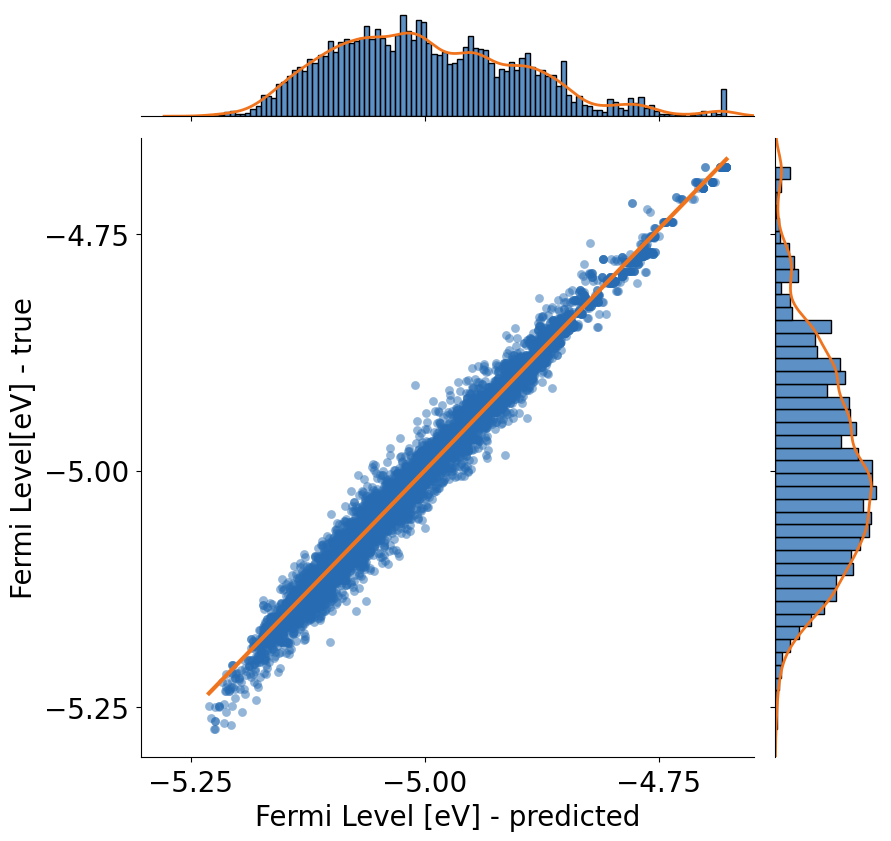

<Figure size 800x800 with 0 Axes>

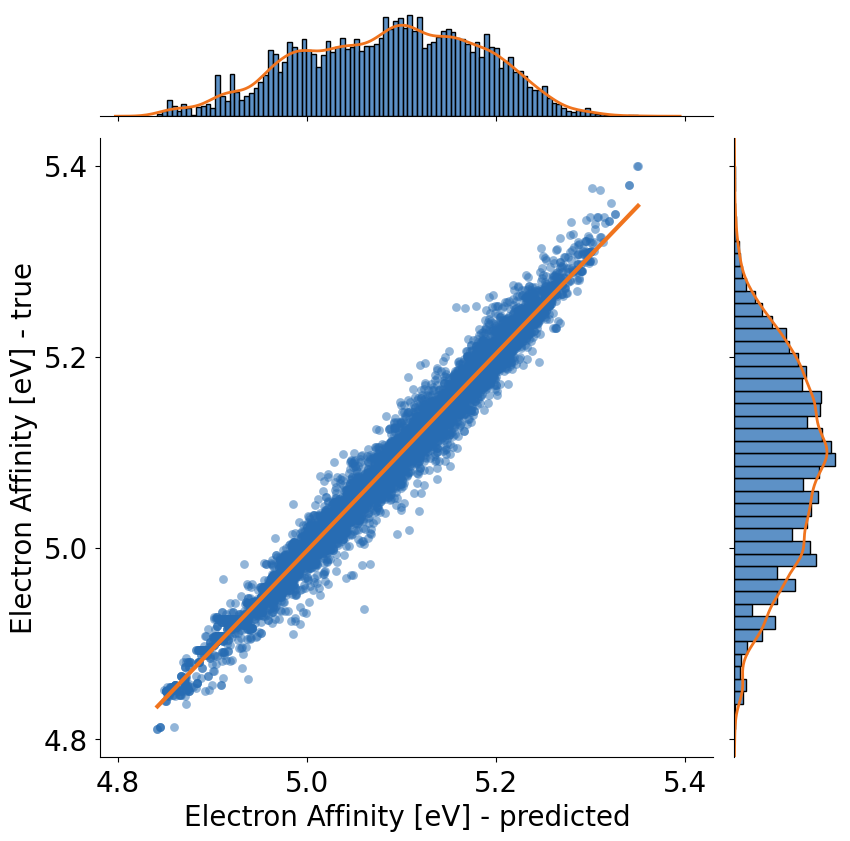

<Figure size 800x800 with 0 Axes>

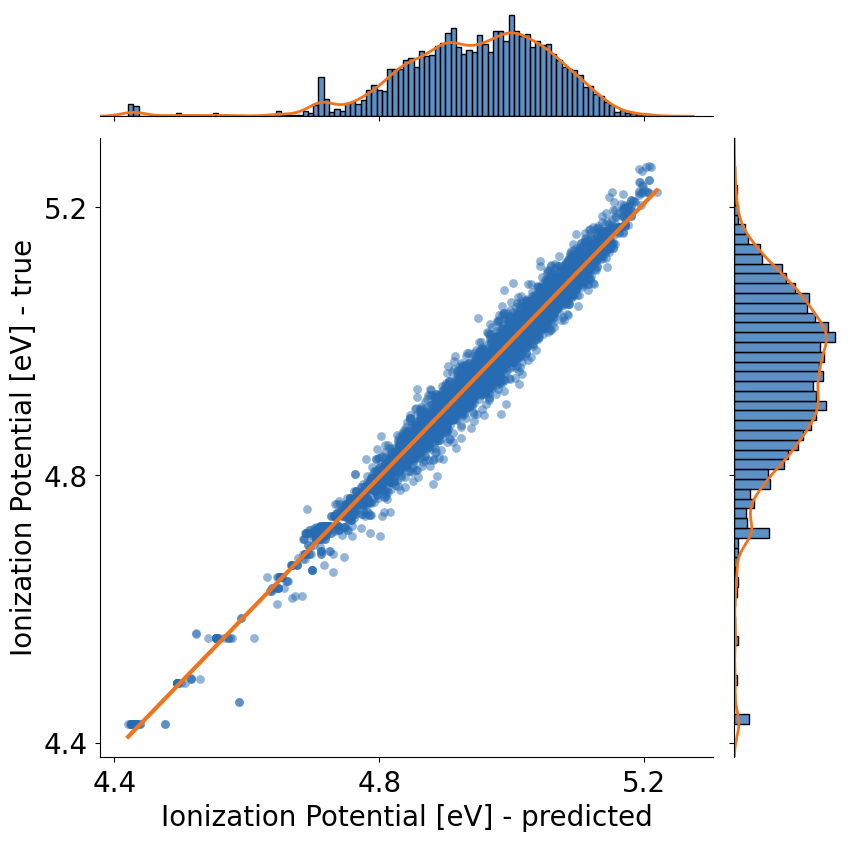

<Figure size 800x800 with 0 Axes>

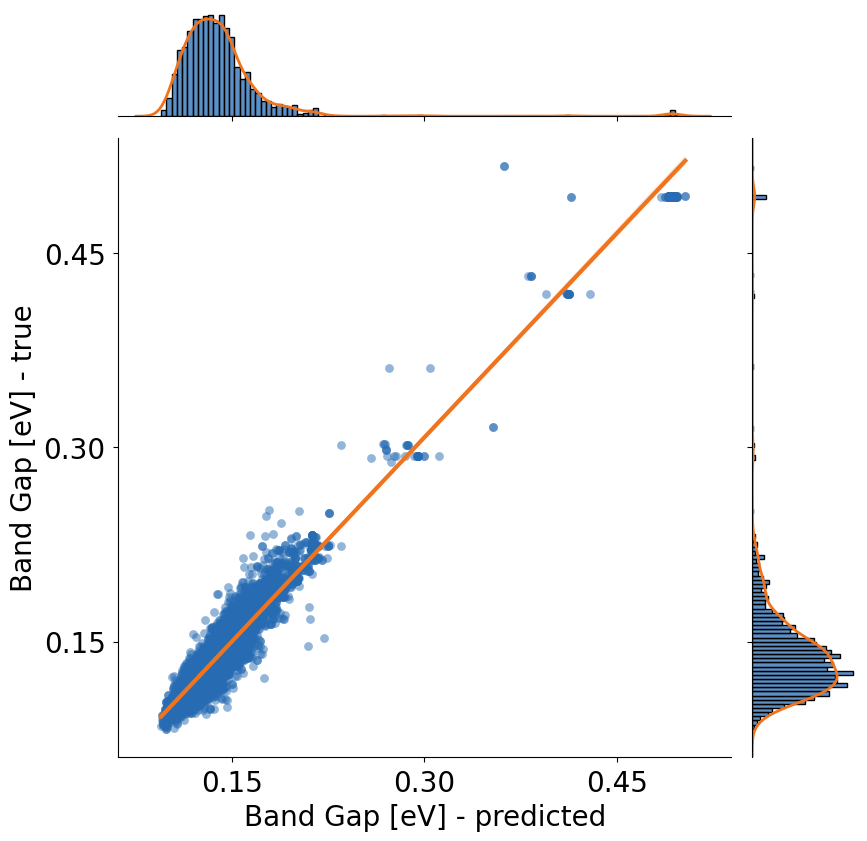

<Figure size 800x800 with 0 Axes>

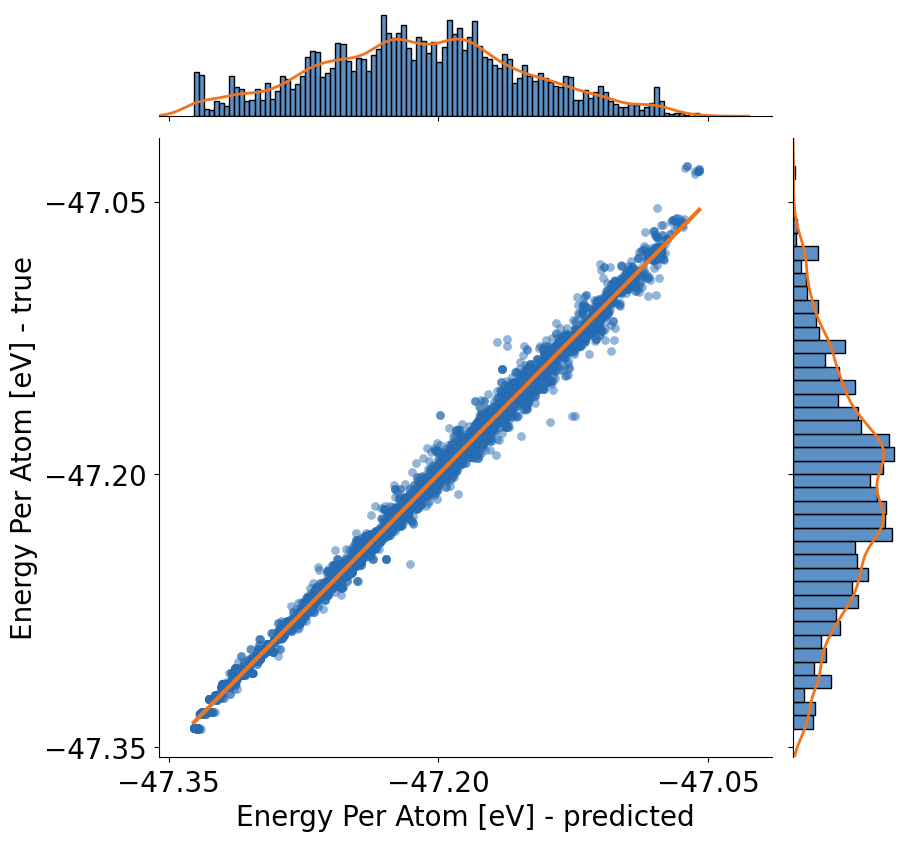

<Figure size 800x800 with 0 Axes>

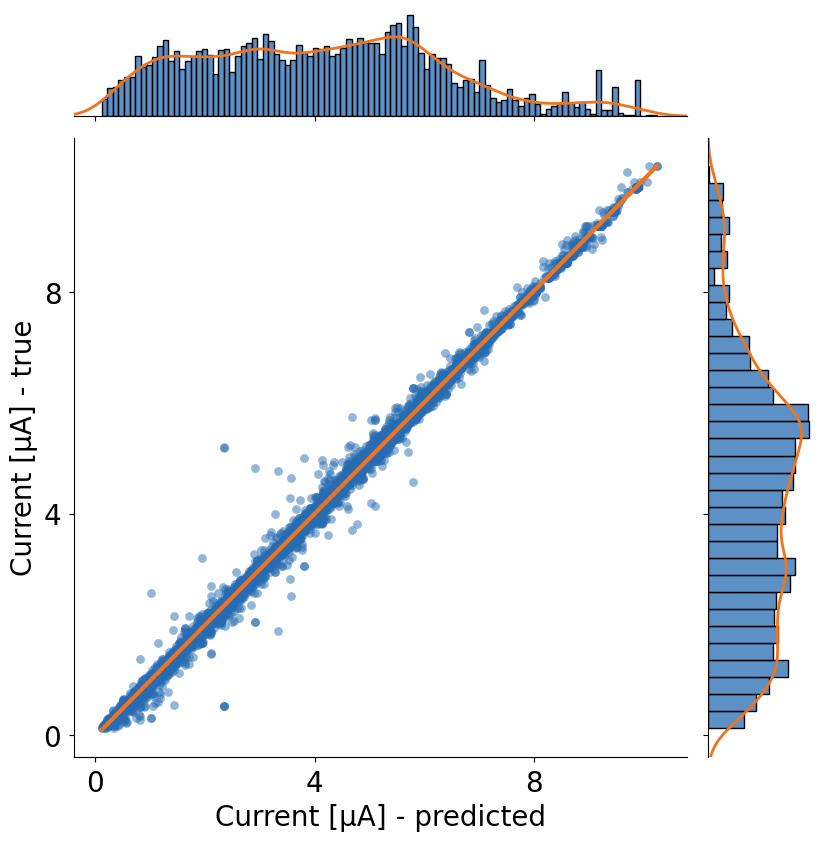

In [32]:
for target in target_list:
    df = pd.read_csv(
        pred_path.joinpath(f"{target}_predictions_train_lightgbm.csv"), header=0
    )

    MAX = np.max(
        [df[f"{target}_predicted"].to_numpy(), df[f"{target}_real"].to_numpy()]
    )
    MIN = np.min(
        [df[f"{target}_predicted"].to_numpy(), df[f"{target}_real"].to_numpy()]
    )

    offset = 0.05 * np.abs(MAX - MIN)
    bound = [MIN - offset, MAX + offset]

    fig = plt.figure(figsize=(8, 8))

    g = sns.JointGrid(height=8)
    x, y = df[f"{target}_predicted"], df[f"{target}_real"]
    sns.regplot(
        x=f"{target}_predicted",
        y=f"{target}_real",
        data=df,
        ax=g.ax_joint,
        scatter_kws={"s": 40, "alpha": 0.5, "color": colors[1]},
        line_kws={"linewidth": 3, "alpha": 1, "color": colors[0]},
    )
    sns.histplot(
        x=x,
        fill=True,
        linewidth=1,
        kde=False,
        ax=g.ax_marg_x,
        stat="density",
        color=colors[1],
        bins=int(np.sqrt(len(x))),
    )
    sns.kdeplot(x=x, linewidth=2, ax=g.ax_marg_x, color=colors[0])
    sns.histplot(
        y=y,
        fill=True,
        linewidth=1,
        kde=False,
        ax=g.ax_marg_y,
        stat="density",
        color=colors[1],
    )
    sns.kdeplot(y=y, linewidth=2, ax=g.ax_marg_y, color=colors[0])

    g.ax_joint.set_xlim(bound)
    g.ax_joint.set_ylim(bound)
    g.ax_joint.tick_params(axis="both", which="major", labelsize=20)
    g.ax_joint.xaxis.set_major_locator(
        MaxNLocator(nbins=3, min_n_ticks=3)
    )  # Auto tick locator
    g.ax_joint.yaxis.set_major_locator(MaxNLocator(nbins=3, min_n_ticks=3))  #
    g.set_axis_labels(
        target_labels[f"{target}"][0], target_labels[f"{target}"][1], fontsize=20
    )

    plt.savefig(
        fit_path.joinpath(f"gbm_{target}_fit_train.png"), dpi=300, bbox_inches="tight"
    )

Residuals XGBoost


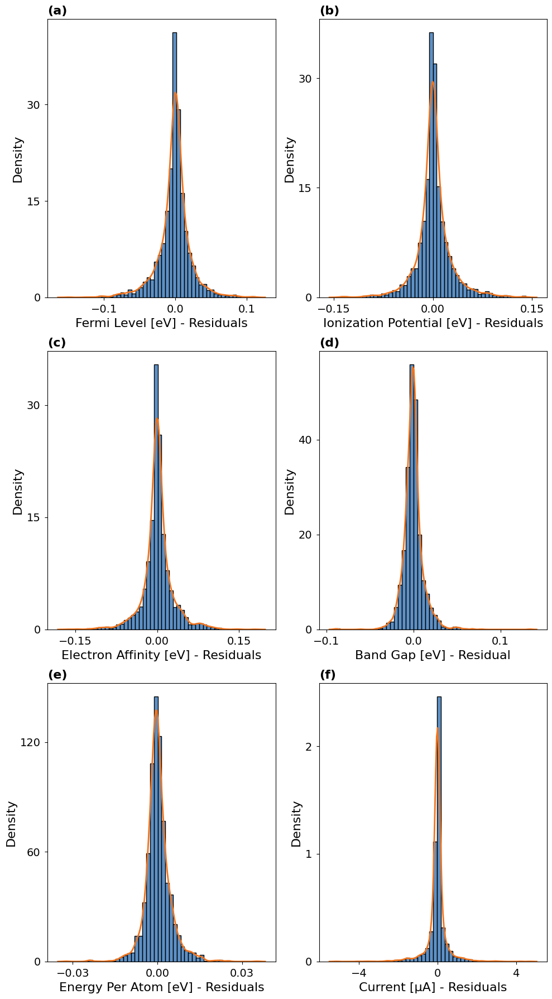

In [33]:
residual_path = plot_path.joinpath("residuals")
residual_path.mkdir(exist_ok=True, parents=True)

residual_target_labels = {
    "fermi_level_ev": ("Fermi Level [eV] - Residuals", "Density"),
    "EA_ev": ("Electron Affinity [eV] - Residuals", "Density"),
    "IP_ev": (
        "Ionization Potential [eV] - Residuals",
        "Density",
    ),
    "band_gap_ev": ("Band Gap [eV] - Residual", "Density"),
    "energy_per_atom": (
        "Energy Per Atom [eV] - Residuals",
        "Density",
    ),
    "current": (
        "Current [μA] - Residuals",
        "Density",
    ),
    "dos": (
        "DOS - Residual",
        "DOS - Density",
    ),
}
# Definire il numero di colonne
num_cols = 2

# Calcolare il numero di righe necessario in base al numero di target
num_targets = len(target_list)
num_rows = (num_targets + num_cols - 1) // num_cols  # Arrotondare verso l'alto

# Creare i subplots
fig, axs = plt.subplots(num_rows, num_cols, figsize=(10, 6 * num_rows))

# Iterare sui target e sugli assi
for idx, target in enumerate(target_list):
    df = pd.read_csv(pred_path.joinpath(f"{target}_predictions.csv"), header=0)
    row = idx // num_cols
    col = idx % num_cols

    ax = axs[row, col] if num_rows > 1 else axs[col]

    sns.histplot(
        x=df[f"{target}_residual"],
        fill=True,
        linewidth=1,
        kde=False,
        stat="density",
        color=colors[1],  # Imposta il colore della distribuzione
        ax=ax,
        bins=int(np.sqrt(len(df[f"{target}_residual"]))),
        )

    sns.kdeplot(x=df[f"{target}_residual"], linewidth=2, color=colors[0], ax=ax)

    ax.xaxis.set_major_locator(MaxNLocator(nbins=3,min_n_ticks=3))  # Imposta massimo 3 ticks sull'asse x
    ax.yaxis.set_major_locator(MaxNLocator(nbins=3,min_n_ticks=3))  # Imposta massimo 3 ticks sull'asse y
    ax.set_xlabel(residual_target_labels[target][0], fontsize=16)
    ax.set_ylabel(residual_target_labels[target][1], fontsize=16)
    ax.tick_params(axis="both", which="major", labelsize=14)

    # Aggiungi un titolo con lettere consecutive
    letter = chr(97 + idx)  # 97 è il codice ASCII per 'a'
    ax.set_title(f"({letter})", loc='left', fontsize=16, fontweight='bold')

# Rimuovere eventuali subplot vuoti
for idx in range(num_targets, num_rows * num_cols):
    fig.delaxes(axs.flat[idx])

# Salvare la figura
plt.tight_layout()
plt.savefig(residual_path.joinpath("residual_plots.png"), dpi=300)
plt.show()


LightGBM Residuals


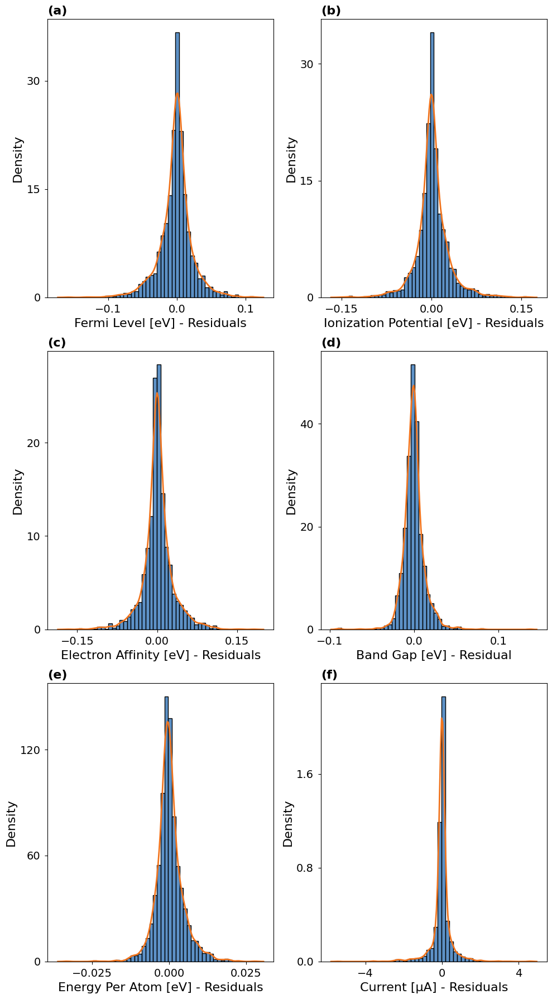

In [34]:
# Definire il numero di colonne
num_cols = 2

# Calcolare il numero di righe necessario in base al numero di target
num_targets = len(target_list)
num_rows = (num_targets + num_cols - 1) // num_cols  # Arrotondare verso l'alto

# Creare i subplots
fig, axs = plt.subplots(num_rows, num_cols, figsize=(10, 6 * num_rows))

# Iterare sui target e sugli assi
for idx, target in enumerate(target_list):
    df = pd.read_csv(pred_path.joinpath(f"{target}_predictions_lightgbm.csv"), header=0)
    row = idx // num_cols
    col = idx % num_cols

    ax = axs[row, col] if num_rows > 1 else axs[col]

    sns.histplot(
        x=df[f"{target}_residual"],
        fill=True,
        linewidth=1,
        kde=False,
        stat="density",
        color=colors[1],  # Imposta il colore della distribuzione
        ax=ax,
        bins=int(np.sqrt(len(df[f"{target}_residual"]))),
        )

    sns.kdeplot(x=df[f"{target}_residual"], linewidth=2, color=colors[0], ax=ax)

    ax.xaxis.set_major_locator(MaxNLocator(nbins=3,min_n_ticks=3))  # Imposta massimo 3 ticks sull'asse x
    ax.yaxis.set_major_locator(MaxNLocator(nbins=3,min_n_ticks=3))  # Imposta massimo 3 ticks sull'asse y
    ax.set_xlabel(residual_target_labels[target][0], fontsize=16)
    ax.set_ylabel(residual_target_labels[target][1], fontsize=16)
    ax.tick_params(axis="both", which="major", labelsize=14)

    # Aggiungi un titolo con lettere consecutive
    letter = chr(97 + idx)  # 97 è il codice ASCII per 'a'
    ax.set_title(f"({letter})", loc='left', fontsize=16, fontweight='bold')

# Rimuovere eventuali subplot vuoti
for idx in range(num_targets, num_rows * num_cols):
    fig.delaxes(axs.flat[idx])

# Salvare la figura
plt.tight_layout()
plt.savefig(residual_path.joinpath("gbm_residual_plots.png"), dpi=300)
plt.show()

XGBoost Features Importance


LightGBM Features Importance


In [35]:
importance_path = plot_path.joinpath("importance")
importance_path.mkdir(exist_ok=True, parents=True)

def plot_feature_importances_heatmap(
    feature_importance_dict, features_list, plot_path, model_name
):
    # Normalize importances between 0 and 1 using MinMaxScaler
    all_importances = np.array(list(feature_importance_dict.values()))
    scaler = MinMaxScaler()
    all_importances_normalized = scaler.fit_transform(all_importances.T)

    targets = list(feature_importance_dict.keys())

    fig, ax = plt.subplots(figsize=(8, 10))
    sns.heatmap(
        all_importances_normalized,
        annot=True,
        fmt=".4f",
        yticklabels=features_list,
        xticklabels=targets,
        cmap=custom_cmap,#"viridis",
        cbar=False,
        # cbar_kws={'label': 'Normalized Importance', },
        ax=ax,
    )
    # ax.set_xlabel("Targets", fontsize=20)
    # ax.set_ylabel("Features", fontsize=20)
    plt.xticks(rotation=45, ha="right", fontsize=14)
    plt.yticks(rotation=0, fontsize=14)

    for spine in ax.spines.values():
        spine.set_visible(True)
        spine.set_linewidth(1.5)

    plt.tight_layout()
    plt.savefig(
        importance_path.joinpath(f"{model_name}_features_importance_heatmap_all_targets.png"),
        dpi=300,
    )
    plt.show()

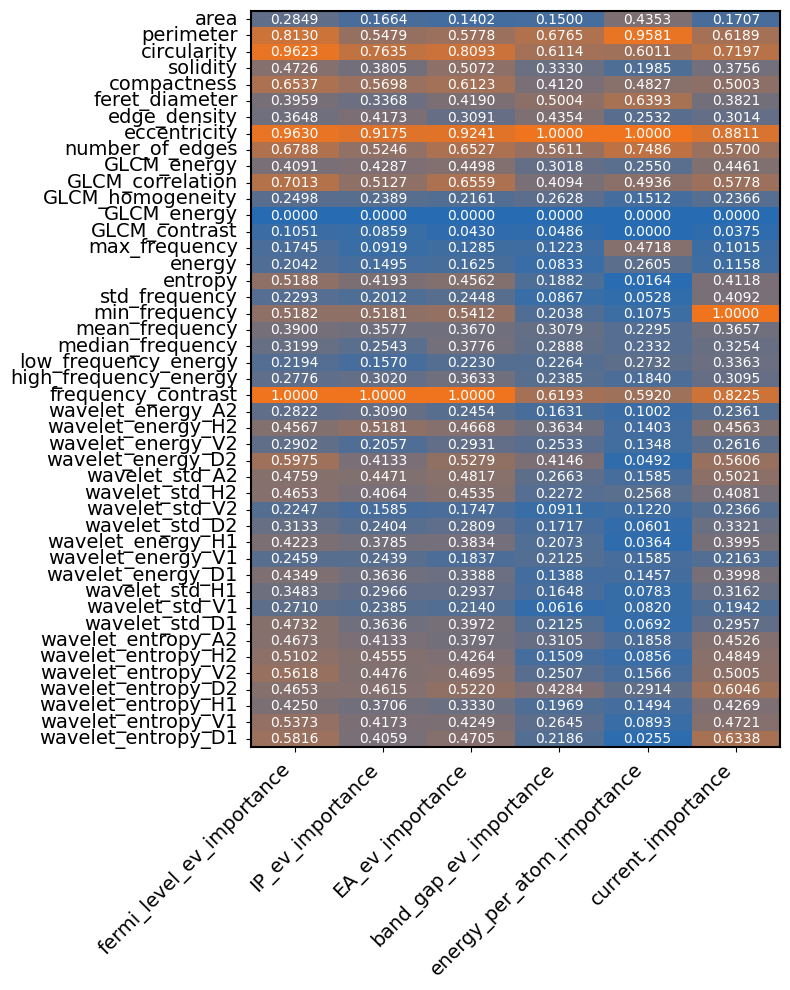

In [36]:
plot_feature_importances_heatmap(
    feature_importance_dict_gbm, features_list, plot_path, model_name="gbm"
)

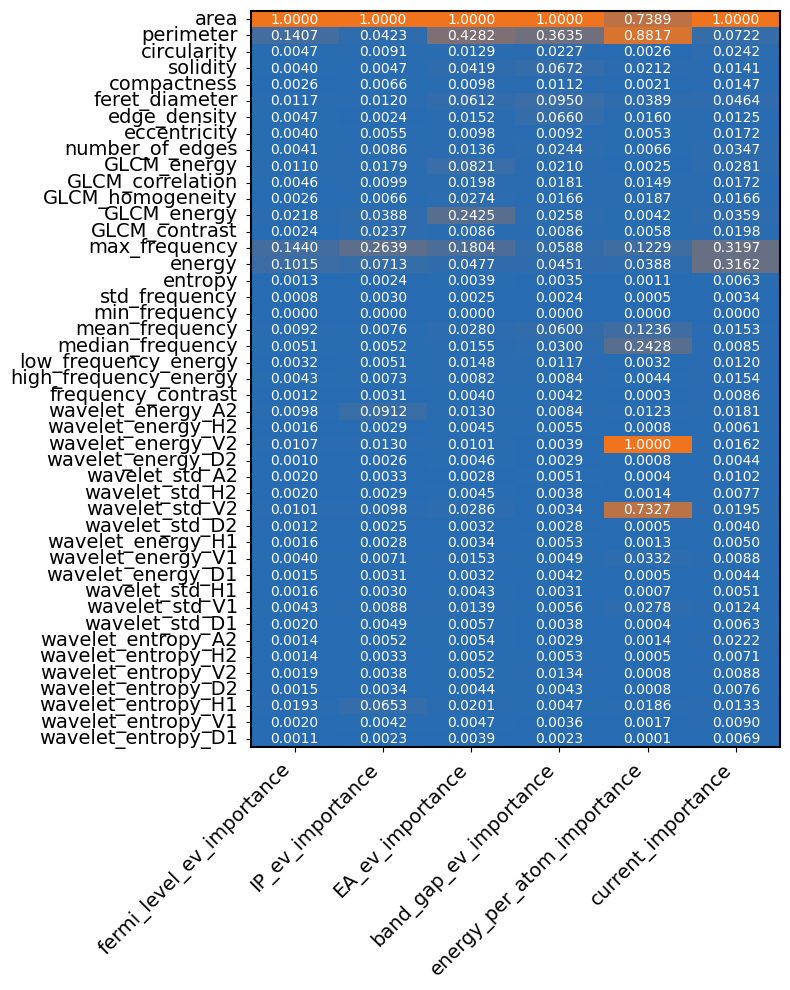

In [37]:
plot_feature_importances_heatmap(
    feature_importance_dict, features_list, plot_path, model_name="xgb"
)

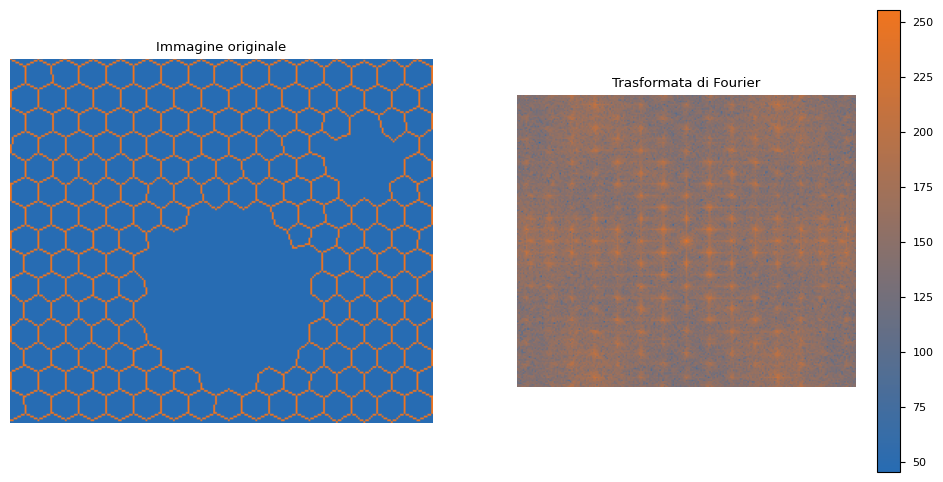

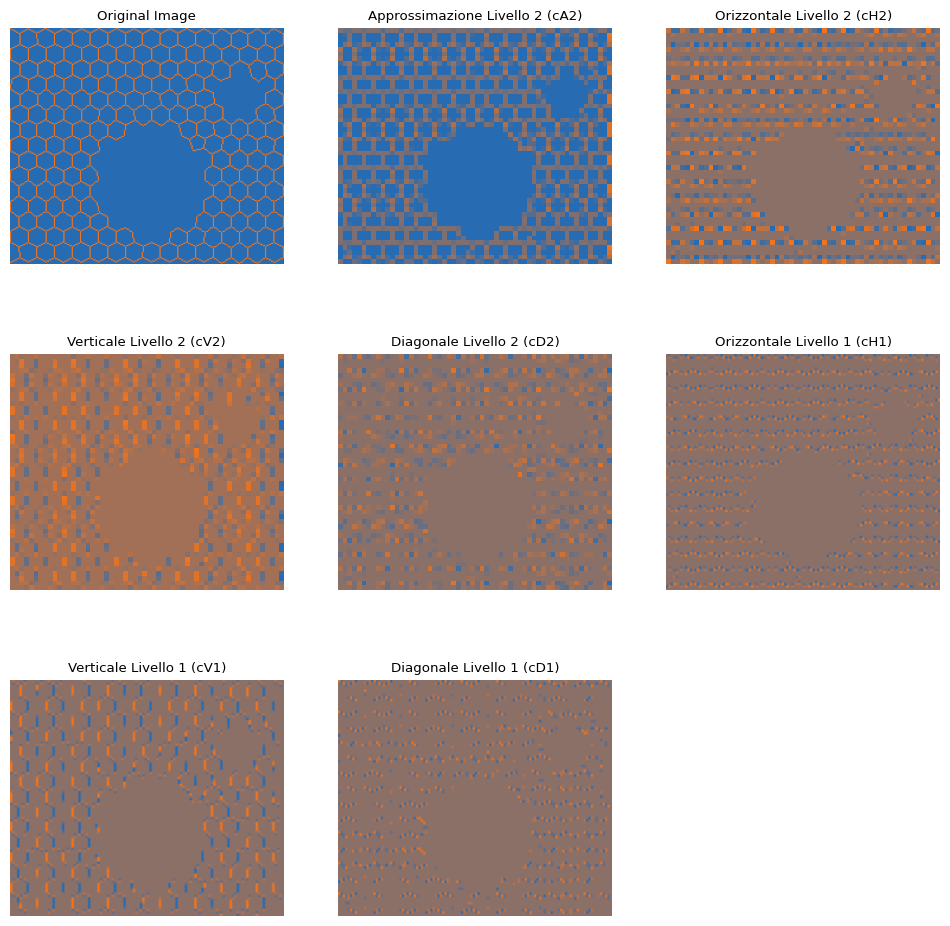

In [43]:
import numpy as np
import matplotlib.pyplot as plt
import pywt
import cv2

# Carica l'immagine in scala di grigi
image = cv2.imread('/home/mario/Mario/Phd_code/GDD/GrapheNetDefectDetector/data_234_new/images/graphene_132_opt.png', cv2.IMREAD_GRAYSCALE)

# Funzione per applicare e visualizzare la trasformata di Fourier
def fourier_transform(image):
    # Applica la trasformata di Fourier
    f_transform = np.fft.fft2(image)
    f_transform_shifted = np.fft.fftshift(f_transform)
    magnitude_spectrum = 20 * np.log(np.abs(f_transform_shifted))

    # Visualizza il risultato
    plt.figure(figsize=(12, 6))
    plt.subplot(121), plt.imshow(image, cmap=custom_cmap)
    plt.title('Immagine originale'), plt.axis('off')
    plt.subplot(122), plt.imshow(magnitude_spectrum, cmap=custom_cmap)
    plt.colorbar()
    plt.title('Trasformata di Fourier'), plt.axis('off')
    plt.show()

def wavelet_transform(image):
    # Applica la trasformata wavelet con 'haar' e livello 2
    coeffs2 = pywt.wavedec2(image, 'haar', level=2)
    cA2, (cH2, cV2, cD2), (cH1, cV1, cD1) = coeffs2

    # Visualizza il risultato
    plt.figure(figsize=(12, 12))
    plt.subplot(331), plt.imshow(image, cmap=custom_cmap)
    plt.title('Original Image'), plt.axis('off')
    plt.subplot(332), plt.imshow(cA2, cmap=custom_cmap)
    plt.title('Approssimazione Livello 2 (cA2)'), plt.axis('off')
    plt.subplot(333), plt.imshow(cH2, cmap=custom_cmap)
    plt.title('Orizzontale Livello 2 (cH2)'), plt.axis('off')
    plt.subplot(334), plt.imshow(cV2, cmap=custom_cmap)
    plt.title('Verticale Livello 2 (cV2)'), plt.axis('off')
    plt.subplot(335), plt.imshow(cD2, cmap=custom_cmap)
    plt.title('Diagonale Livello 2 (cD2)'), plt.axis('off')
    plt.subplot(336), plt.imshow(cH1, cmap=custom_cmap)
    plt.title('Orizzontale Livello 1 (cH1)'), plt.axis('off')
    plt.subplot(337), plt.imshow(cV1, cmap=custom_cmap)
    plt.title('Verticale Livello 1 (cV1)'), plt.axis('off')
    plt.subplot(338), plt.imshow(cD1, cmap=custom_cmap)
    plt.title('Diagonale Livello 1 (cD1)'), plt.axis('off')

    plt.show()
    return cA2, (cH2, cV2, cD2), (cH1, cV1, cD1)

# Esegui le trasformazioni e visualizza i risultati
fourier_transform(image)
cA2, (cH2, cV2, cD2), (cH1, cV1, cD1) = wavelet_transform(image)


/home/mario/miniconda3/envs/yolo_gdd/lib/python3.10/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


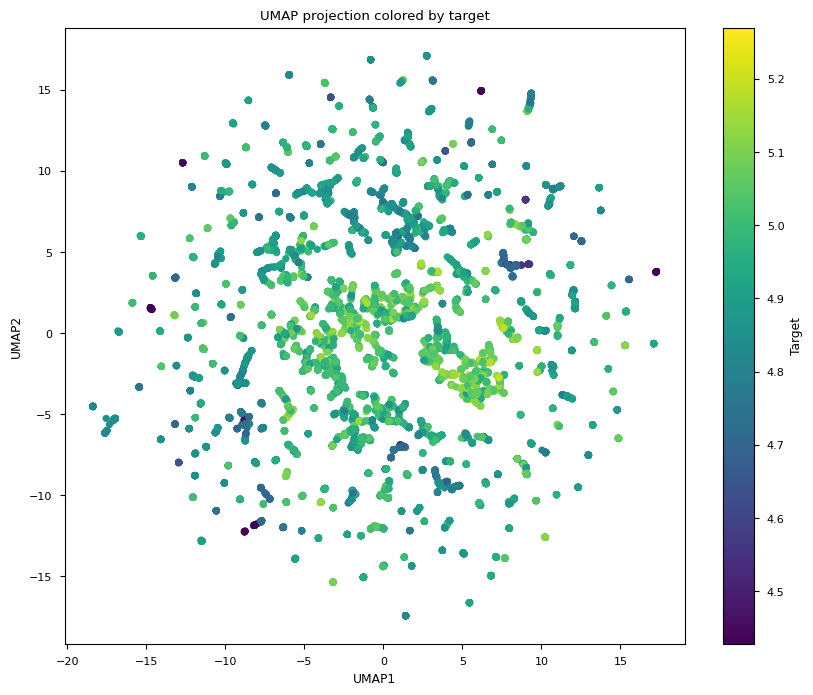

In [46]:
from umap import UMAP

X = grouped_df[features_list]  # Features
y = grouped_df["EA_ev"]  # Target

# Normalizzazione dei dati
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Applicazione di UMAP per ridurre a 2 dimensioni
umap_model = UMAP(n_neighbors=25, min_dist=0.1, n_components=2, random_state=3333)
X_umap = umap_model.fit_transform(X_scaled)

# Visualizzazione dei risultati con i cluster colorati in base al target
plt.figure(figsize=(10, 8))
palette = sns.color_palette("viridis", as_cmap=True)
scatter = plt.scatter(X_umap[:, 0], X_umap[:, 1], c=y, cmap=palette, s=25)
plt.colorbar(scatter, label='Target')
plt.title('UMAP projection colored by target')
plt.xlabel('UMAP1')
plt.ylabel('UMAP2')
plt.show()

In [47]:
grouped_df.head()


,file_name,n_atoms,area,num_pixels,perimeter,circularity,solidity,compactness,feret_diameter,eccentricity,...,wavelet_std_H1,wavelet_std_V1,wavelet_std_D1,wavelet_entropy_A2,wavelet_entropy_H2,wavelet_entropy_V2,wavelet_entropy_D2,wavelet_entropy_H1,wavelet_entropy_V1,wavelet_entropy_D1
0,graphene_10007,486,3425.0,8190,398.551422,0.537826,132.029449,23.985917,56.646946,0.344143,...,21.982764,23.119807,18.230988,2.115003,1.167751,1.184388,1.076016,0.448531,0.474295,0.369135
1,graphene_100078,441,8798.0,17680,704.959525,0.582641,244.680507,21.620034,78.033131,0.333363,...,20.144794,22.268827,17.934977,1.977503,1.071023,1.101106,0.999485,0.408034,0.457335,0.366795
2,graphene_100148,448,7122.0,11252,357.780457,0.699163,356.100000,17.973442,105.000000,0.515079,...,20.560266,22.224793,17.837542,2.051759,1.109100,1.127900,1.024318,0.416802,0.448894,0.355629
3,graphene_100151,440,7947.5,14152,378.790354,0.696053,345.543478,18.053744,106.271423,0.340174,...,21.041132,22.022257,17.171500,2.011814,1.026944,1.095842,0.951691,0.413425,0.433160,0.340768
4,graphene_10025,506,782.5,3101,195.446685,0.501334,33.913959,25.157162,33.988939,0.722629,...,22.054325,24.065851,18.947960,2.122395,1.203567,1.263611,1.075773,0.461416,0.497881,0.396376


/home/mario/miniconda3/envs/yolo_gdd/lib/python3.10/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


File selezionato: graphene_333463 (indice: 5989)
File selezionato: graphene_82635 (indice: 12584)


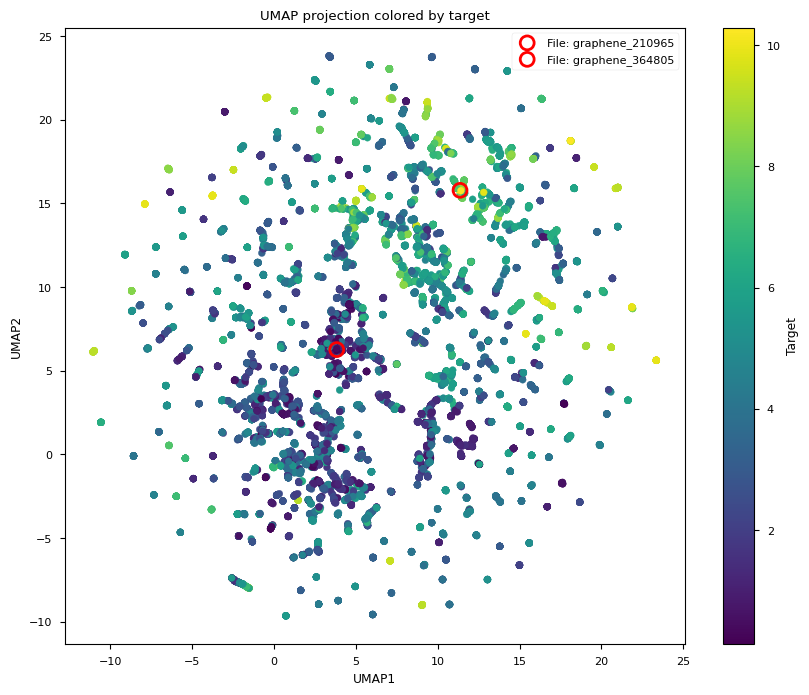

In [60]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from umap import UMAP

# Supponiamo che 'grouped_df' sia il DataFrame con le features e il target
# e 'file_name' sia una colonna separata che contiene i nomi dei file.

X = grouped_df[features_list]  # Features
y = grouped_df["current"]  # Target
file_names = grouped_df["file_name"]  # File names

# Normalizzazione dei dati
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Applicazione di UMAP per ridurre a 2 dimensioni
umap_model = UMAP(n_neighbors=25, min_dist=0.1, n_components=2, random_state=3333, metric="cosine")
X_umap = umap_model.fit_transform(X_scaled)

# Visualizzazione dei risultati con i cluster colorati in base al target
plt.figure(figsize=(10, 8))
palette = sns.color_palette("viridis", as_cmap=True)
scatter = plt.scatter(X_umap[:, 0], X_umap[:, 1], c=y, cmap=palette, s=25)
plt.colorbar(scatter, label='Target')
plt.title('UMAP projection colored by target')
plt.xlabel('UMAP1')
plt.ylabel('UMAP2')

# Selezioniamo due punti casuali
random_indices = np.random.choice(len(X_umap), size=2, replace=False)
idxs = [np.argmax(y), np.argmin(y)]
# Cerchiamo i punti e disegniamo un cerchio attorno a loro
for idx in idxs:
    plt.scatter(X_umap[idx, 0], X_umap[idx, 1], facecolors='none', edgecolors='r', s=100, linewidths=2, label=f'File: {file_names[idx]}')

# Mostra i nomi dei file selezionati
for idx in random_indices:
    print(f"File selezionato: {file_names[idx]} (indice: {idx})")

plt.legend()
plt.show()


/home/mario/miniconda3/envs/yolo_gdd/lib/python3.10/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


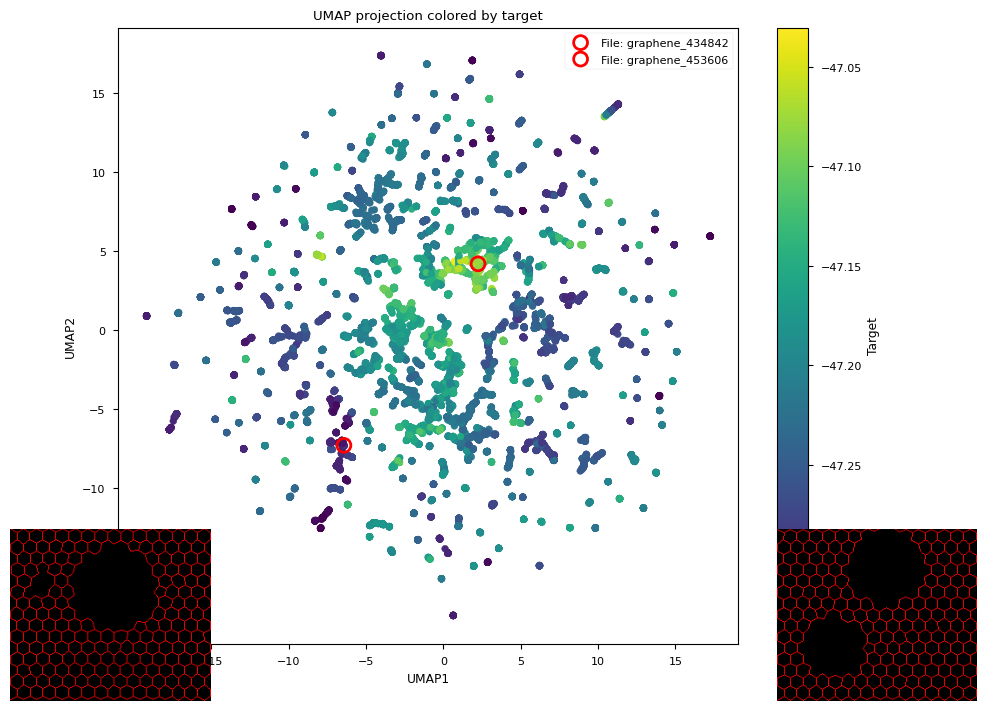

In [87]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from umap import UMAP
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import os
from PIL import Image

# Supponiamo che 'grouped_df' sia il DataFrame con le features, target e file_name
X = grouped_df[features_list]  # Features
y = grouped_df["energy_per_atom"]  # Target
file_names = grouped_df["file_name"]  # File names

# Normalizzazione dei dati
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Applicazione di UMAP per ridurre a 2 dimensioni
umap_model = UMAP(n_neighbors=25, min_dist=0.1, n_components=2, random_state=3333)
X_umap = umap_model.fit_transform(X_scaled)

# Visualizzazione dei risultati con i cluster colorati in base al target
plt.figure(figsize=(10, 8))
palette = sns.color_palette("viridis", as_cmap=True)
scatter = plt.scatter(X_umap[:, 0], X_umap[:, 1], c=y, cmap=palette, s=25)
plt.colorbar(scatter, label='Target')
plt.title('UMAP projection colored by target')
plt.xlabel('UMAP1')
plt.ylabel('UMAP2')

# Selezioniamo due punti casuali
random_indices = np.random.choice(len(X_umap), size=2, replace=False)
idxs = [np.argmax(y), np.argmin(y)]

# Funzione per caricare l'immagine dalla cartella 'images'
def get_image(file_name, folder="images"):
    img_path = images_path.joinpath(f"{file_name}_opt.png")
    img = Image.open(img_path)
    return img

for idx in idxs:
    plt.scatter(X_umap[idx, 0], X_umap[idx, 1], facecolors='none', edgecolors='r', s=100, linewidths=2, label=f'File: {grouped_df["file_name"].iloc[idx]}')
plt.legend()
# Aggiungiamo le immagini negli angoli in basso a sinistra e in basso a destra
positions = ['lower left', 'lower right']
for idx, position in zip(idxs, positions):
    # Otteniamo il file name associato
    file_name = file_names[idx]

    # Carichiamo l'immagine corrispondente dal file system
    img = get_image(file_name)

    # Creiamo un inset axis in basso a sinistra e in basso a destra
    ax_inset = inset_axes(plt.gca(), width=2.0, height=2.0,  # dimensioni in pollici
                          loc=position,  # posizione fissa (lower left, lower right)
                          bbox_to_anchor=(0, 0, 1, 1),  # usa l'intero grafico
                          bbox_transform=plt.gcf().transFigure, borderpad=1.5)

    # Mostriamo l'immagine nell'inset axis

    ax_inset.imshow(img)
    ax_inset.axis('off')  #
    


In [90]:
grouped_df[target_list].iloc[8834]

fermi_level_ev       -4.7014
IP_ev                 4.9076
EA_ev                 4.4886
band_gap_ev            0.419
energy_per_atom   -47.339876
current              7.47941
Name: 9030, dtype: object

In [88]:
idxs

[8401, 8834]